# Obtenir les données

## Récupérer les données.
- Aprés avoir téléchargé mes quatre fichiers sur DrivenData sur mon disque dur, j'ai importer les quatre fichier dans mon notebook et je les ai stoqué dans des variable. 
- J'ai utilisé pour cela la fonction "read_csv" de la librairie pandas (alias "pd") que j'ai également importé. Cette fonction permet de lire des fichiers sous format csv et de les stoqués dans un "DataFrame".

In [1]:
import pandas as pd

features_train = pd.read_csv('datasets/dengue_features_train.csv')
features_test = pd.read_csv('datasets/dengue_features_test.csv')
labels_train = pd.read_csv('datasets/dengue_labels_train.csv')
submission_format = pd.read_csv('datasets/submission_format.csv')

## Examiner la structure des données

- Examinons la structure générale des données

In [2]:
features_train
#le dataframe feature_train correspond à notre jeu d'entrainement.
#Chaque ligne represente une semaine. On peut voir également qu'il y a 24 variables

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
0,sj,1990,18,1990-04-30,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,...,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0
1,sj,1990,19,1990-05-07,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,...,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6
2,sj,1990,20,1990-05-14,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,...,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4
3,sj,1990,21,1990-05-21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,...,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0
4,sj,1990,22,1990-05-28,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,...,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1451,iq,2010,21,2010-05-28,0.342750,0.318900,0.256343,0.292514,55.30,299.334286,...,45.00,88.765714,55.30,18.485714,9.800000,28.633333,11.933333,35.4,22.4,27.0
1452,iq,2010,22,2010-06-04,0.160157,0.160371,0.136043,0.225657,86.47,298.330000,...,207.10,91.600000,86.47,18.070000,7.471429,27.433333,10.500000,34.7,21.7,36.6
1453,iq,2010,23,2010-06-11,0.247057,0.146057,0.250357,0.233714,58.94,296.598571,...,50.60,94.280000,58.94,17.008571,7.500000,24.400000,6.900000,32.2,19.2,7.4
1454,iq,2010,24,2010-06-18,0.333914,0.245771,0.278886,0.325486,59.67,296.345714,...,62.33,94.660000,59.67,16.815714,7.871429,25.433333,8.733333,31.2,21.0,16.0


In [3]:
features_train.info()
#La méthode info() decrit les données en fournissant:
#total de ligne: RangeIndex: 1456 entries, 0 to 1455
#Le type de chaque variable: nous pouvons observer que la plupart des variables (20 variables sur 24) sont de type "float"(nombre à virgule flottante),
#Nous avons aussi deux variables de types object (city et weekofyear)
#Et deux variables ('year' et 'weekofyear') de type "int" (nombre entier) 
#Nous pouvons aussi observer le nombre de valeurs non nulles, il semblerait que certaine variable contienne quelque valeur nulle, Comme 'ndvi_ne' qui compte 1262 valeurs non nulles sur un totale de 1456 lignes, donc il y a 194 valeurs manquantes pour cette variable là.
#Ces valeurs maquantes doivent etre traité car la plupart des algorithme de machine learning ne fonctionne pas tres bien avec des valeurs manquante

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1456 entries, 0 to 1455
Data columns (total 24 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   city                                   1456 non-null   object 
 1   year                                   1456 non-null   int64  
 2   weekofyear                             1456 non-null   int64  
 3   week_start_date                        1456 non-null   object 
 4   ndvi_ne                                1262 non-null   float64
 5   ndvi_nw                                1404 non-null   float64
 6   ndvi_se                                1434 non-null   float64
 7   ndvi_sw                                1434 non-null   float64
 8   precipitation_amt_mm                   1443 non-null   float64
 9   reanalysis_air_temp_k                  1446 non-null   float64
 10  reanalysis_avg_temp_k                  1446 non-null   float64
 11  rean

In [4]:
labels_train 
#le dataframe feature_train contient la variable cible ('total_cases') du jeu d'entrainement(features_train)
#Chaque ligne represente une semaine (le meme semaine que dans 'features_train'). On peut voir également qu'il y a 4 variables
#Ces deux jeux de données('labels_train' et'features_train') serviront à l'entrainement de la machine

,city,year,weekofyear,total_cases
0,sj,1990,18,4
1,sj,1990,19,5
2,sj,1990,20,4
3,sj,1990,21,3
4,sj,1990,22,6
...,...,...,...,...
1451,iq,2010,21,5
1452,iq,2010,22,8
1453,iq,2010,23,1
1454,iq,2010,24,1


In [5]:
labels_train.info()
#label_train contient 1456 lignes et 4 variable ( dont trois de type "int"(valeur entiere) et une variable de type object)
#nous pouvons également constater qu'aucune valeur n'est nulle

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1456 entries, 0 to 1455
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   city         1456 non-null   object
 1   year         1456 non-null   int64 
 2   weekofyear   1456 non-null   int64 
 3   total_cases  1456 non-null   int64 
dtypes: int64(3), object(1)
memory usage: 45.6+ KB


In [6]:
features_test
#Ce jeu de données sera mon jeu de test, c'est sur ce jeu que j'appliquerai le modele final pour le soumettre sur DrivenData afin de connaitre mon score et ma position dans le classement
#ce jeu de données sera bien isolé et ne sera pas explorer pour éviter le biais d'espionage des données 

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
0,sj,2008,18,2008-04-29,-0.018900,-0.018900,0.102729,0.091200,78.60,298.492857,...,25.37,78.781429,78.60,15.918571,3.128571,26.528571,7.057143,33.3,21.7,75.2
1,sj,2008,19,2008-05-06,-0.018000,-0.012400,0.082043,0.072314,12.56,298.475714,...,21.83,78.230000,12.56,15.791429,2.571429,26.071429,5.557143,30.0,22.2,34.3
2,sj,2008,20,2008-05-13,-0.001500,NaN,0.151083,0.091529,3.66,299.455714,...,4.12,78.270000,3.66,16.674286,4.428571,27.928571,7.785714,32.8,22.8,3.0
3,sj,2008,21,2008-05-20,NaN,-0.019867,0.124329,0.125686,0.00,299.690000,...,2.20,73.015714,0.00,15.775714,4.342857,28.057143,6.271429,33.3,24.4,0.3
4,sj,2008,22,2008-05-27,0.056800,0.039833,0.062267,0.075914,0.76,299.780000,...,4.36,74.084286,0.76,16.137143,3.542857,27.614286,7.085714,33.3,23.3,84.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
411,iq,2013,22,2013-05-28,0.301471,0.380029,0.280629,0.383186,41.12,297.774286,...,67.60,89.990000,41.12,17.185714,10.100000,27.400000,9.050000,32.6,21.8,33.0
412,iq,2013,23,2013-06-04,0.247600,0.296343,0.285371,0.350357,71.52,297.167143,...,45.70,93.891429,71.52,17.448571,9.657143,27.520000,10.720000,33.8,21.4,68.0
413,iq,2013,24,2013-06-11,0.238729,0.251029,0.252586,0.249771,78.96,295.831429,...,45.22,94.967143,78.96,16.410000,7.385714,27.200000,10.075000,32.6,21.6,93.2
414,iq,2013,25,2013-06-18,0.310429,0.302700,0.406614,0.403943,39.54,295.778571,...,4.70,89.057143,39.54,15.137143,8.228571,26.700000,8.480000,32.2,21.8,34.1


In [7]:
features_test.info()
#feature_test compte 416 lignes et 24 colonnes du meme nombre et types de variable que le jeu de données "features_train" (float64(20), int64(2), object(2))
#Certaines variables comptent des valeurs null.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 416 entries, 0 to 415
Data columns (total 24 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   city                                   416 non-null    object 
 1   year                                   416 non-null    int64  
 2   weekofyear                             416 non-null    int64  
 3   week_start_date                        416 non-null    object 
 4   ndvi_ne                                373 non-null    float64
 5   ndvi_nw                                405 non-null    float64
 6   ndvi_se                                415 non-null    float64
 7   ndvi_sw                                415 non-null    float64
 8   precipitation_amt_mm                   414 non-null    float64
 9   reanalysis_air_temp_k                  414 non-null    float64
 10  reanalysis_avg_temp_k                  414 non-null    float64
 11  reanal

In [8]:
submission_format
#Submission_format correspond simplement au format de soumission pour DrivenData. Il faudra tout simplement remplacer les valeurs de la variable 'total_cases' (qui sont toute à 0) par les prévisions de mon modele aura fait à partir du jeu 'features_test'

,city,year,weekofyear,total_cases
0,sj,2008,18,0
1,sj,2008,19,0
2,sj,2008,20,0
3,sj,2008,21,0
4,sj,2008,22,0
...,...,...,...,...
411,iq,2013,22,0
412,iq,2013,23,0
413,iq,2013,24,0
414,iq,2013,25,0


In [9]:
submission_format.info()
#submission_format compte 416 lignes et pas de donnée manquante
#Toute les variable sont de type "int" sauf la variable "city" qui est de type "object"

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 416 entries, 0 to 415
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   city         416 non-null    object
 1   year         416 non-null    int64 
 2   weekofyear   416 non-null    int64 
 3   total_cases  416 non-null    int64 
dtypes: int64(3), object(1)
memory usage: 13.1+ KB


# Explorer les données

In [10]:
#Créons des copie des données pour ne pas alterer les données originaux pendant l'exploration
X_train = features_train.copy()
y_train = labels_train.copy()
X_test = features_test.copy()
sub_format = submission_format.copy()

In [11]:
# Apres l'examination de la structure des données, j'ai remarqué que la variable "week_start_date" est une date(YYYY-MM-DD) mais que son type est "object". convertissons là pour qu'elle aie un type plus manipulable pour les dates:"datetime"
X_train['week_start_date']= pd.to_datetime(X_train['week_start_date'], format='%Y-%m-%d')

In [12]:
#Pour faciliter l'exploration des données, je crée un nouveau dataframe que j'utiliserai que pendant cette phase d'exploration. Ce nouveau jeu de données contiendra l'integralité de X_train ainsi que la variable 'total_cases' (notre valeur cible) du data frame y_train:
X = X_train.copy()
X['total_cases'] = y_train['total_cases']

In [13]:
#Pour encore plus de praticité, séparons la variable week_start_date en trois variable : day, month et year (mais la variable 'year' est deja presente dans le dataframe donc je n'aurai besoin que des deux premiere)
X["day"]= X.week_start_date.dt.day #Extraction du jour depuis week_start_date
X["month"]= X.week_start_date.dt.month #Extraction du mois depuis week_start_date

In [14]:
#Ensuite je supprime la variable week_start_date car je n'en ai plus besoin vu que j'ai deja une variable day, month et year
#X = X.drop(['week_start_date'], axis=1)

In [15]:
#VOici à quoi ressemble notre jeu de 

In [16]:
#Vue que nous avons deux ville (sj et iq) qui sont representé dans notre dataframe, il serait interessant de creer deux nouveau dataframe afin de pouvoir les explorer séparerment.
X_sj = X[X['city']=='sj']
X_iq = X[X['city']=='iq']

In [17]:
#Nous pouvons supprimer la variable city dans ces deux jeu de données car elle ne sert plus à rien.
X_sj = X_sj.drop(['city'], axis=1)
X_iq = X_iq.drop(['city'], axis=1)

## Quatres types de variables

In [18]:
#Vu qu'il n y a pas beaucoup de variable, Je peux me permettre de les classer manuellement selon leur type:
X.columns

Index(['city', 'year', 'weekofyear', 'week_start_date', 'ndvi_ne', 'ndvi_nw',
       'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k',
       'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
       'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
       'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
       'station_min_temp_c', 'station_precip_mm', 'total_cases', 'day',
       'month'],
      dtype='object')

In [19]:
#Variable quantitative discrete 
v_quant_disc =['total_cases']
#Variable quantitative continue
v_quant_cont =[ 
    'ndvi_ne',
    'ndvi_nw',
    'ndvi_se',
    'ndvi_sw',
    'precipitation_amt_mm',
    'reanalysis_air_temp_k',
    'reanalysis_avg_temp_k',
    'reanalysis_dew_point_temp_k',
    'reanalysis_max_air_temp_k',
    'reanalysis_min_air_temp_k',
    'reanalysis_precip_amt_kg_per_m2',
    'reanalysis_relative_humidity_percent',
    'reanalysis_sat_precip_amt_mm',
    'reanalysis_specific_humidity_g_per_kg',
    'reanalysis_tdtr_k',
    'station_avg_temp_c',
    'station_diur_temp_rng_c',
    'station_max_temp_c',
    'station_min_temp_c',
    'station_precip_mm']
#Variable qualitative nominale
v_qual_nomi = ['city']
#Variable qualitative ordinale
v_qual_ordi = [
    'year',
    'weekofyear', 
    'day',
    'month']

## la distribution empirique des variables

In [20]:
#--Importons la libraire matplotlib 
import matplotlib.pyplot as plt

### Variable qualitative Nominale

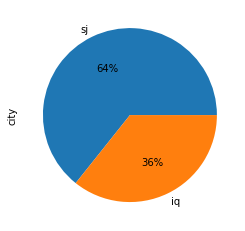

In [21]:
#Diagamme en secteur
X['city'].value_counts(normalize=True).plot(kind='pie',autopct="%.0f%%")
plt.show() # Affiche le graphique
#Nous pouvons constaster a travers ce diagramme en secteur que 64% des observation proviennent de sj (San Juan) et 36% d'Iquitos

### Variable qualitative Nominale

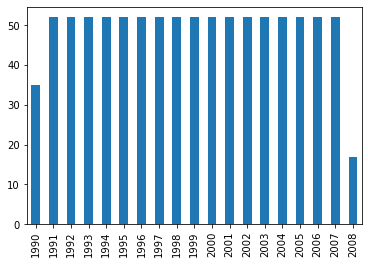

In [22]:
#nombre d'observations par année pour San Juan
X_sj['year'].value_counts().sort_index(). plot(kind='bar')
plt.show()
#Remarque : l'année 1995 et 2008 rescence moins d'observation que les autres années

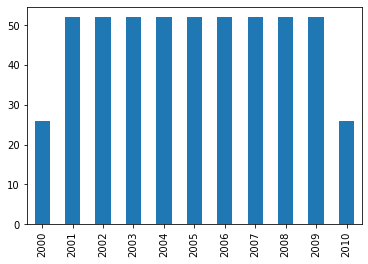

In [23]:
#nombre d'observations par année pour Iquitos
X_iq['year'].value_counts().sort_index(). plot(kind='bar')
plt.show()
#Remarque : Comme à San Juan il y a moins d'observations pour les années aux extremités. Nous observons également que les données récoltée à Iquitos couvre moins d'années qu'à San Juan (10 années pour Iquitos contre 19 années pour SanJuan)
#le jeu de données des deux villes n'ont pas la même plage de donnée:
#San Juan : De 1990 à 2008
#Iquitos : De 2000 à 2010

In [24]:
# l'analyse de la distribution empirique des variable day, month et weekofyear n'a pas de sens.

## Variable quantitative continue

--------------------
ndvi_ne
Moyenne:
 0.05792473383892619
Mediane:
 0.0577
Mode:
 0.0455
Variance:
 0.011466304152884143
Ecart-type:
 0.10708082999717616


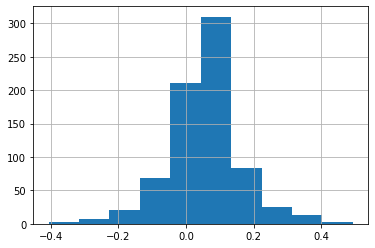

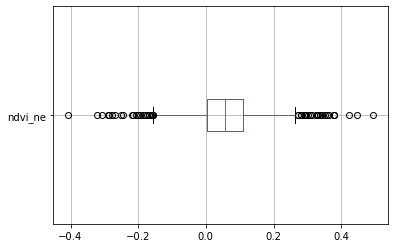

--------------------
ndvi_nw
Moyenne:
 0.06746906815219837
Mediane:
 0.068075
Mode:
 0.0278
Variance:
 0.008542681382388562
Ecart-type:
 0.0924266270205105


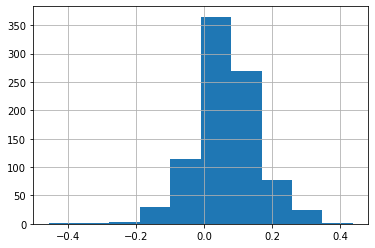

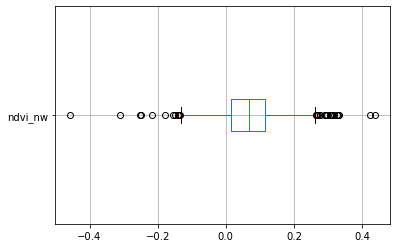

--------------------
ndvi_se
Moyenne:
 0.17765518395092691
Mediane:
 0.1771857
Mode:
 0.08821429
Variance:
 0.003264426812553941
Ecart-type:
 0.05713516266323166


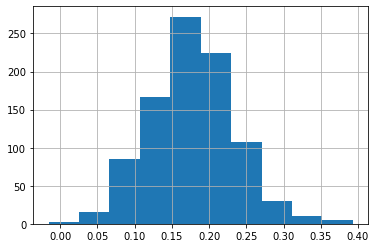

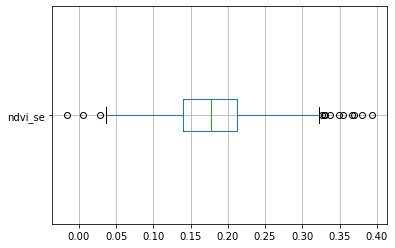

--------------------
ndvi_sw
Moyenne:
 0.16595574576881117
Mediane:
 0.1659714
Mode:
 0.1688714
Variance:
 0.0031407899372220866
Ecart-type:
 0.05604275097835657


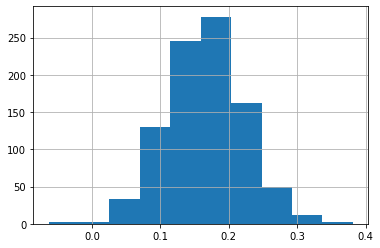

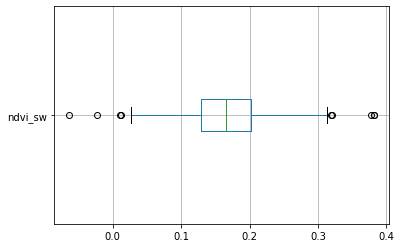

--------------------
precipitation_amt_mm
Moyenne:
 35.47080906148867
Mediane:
 20.8
Mode:
 0.0
Variance:
 1987.561049722984
Ecart-type:
 44.582070944752935


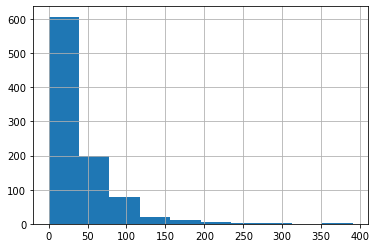

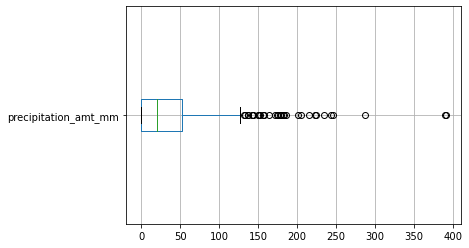

--------------------
reanalysis_air_temp_k
Moyenne:
 299.16365284178744
Mediane:
 299.254285714
Mode:
 299.885714286
Variance:
 1.5271133058286626
Ecart-type:
 1.2357642598119847


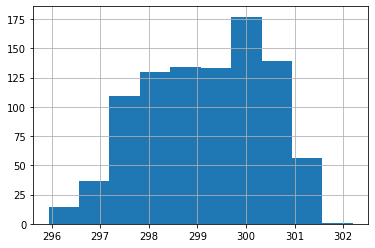

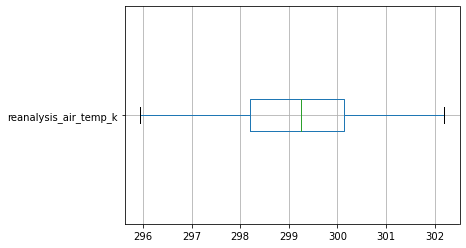

--------------------
reanalysis_avg_temp_k
Moyenne:
 299.2769201229012
Mediane:
 299.378571429
Mode:
 299.842857143
Variance:
 1.483480430986284
Ecart-type:
 1.2179821143950693


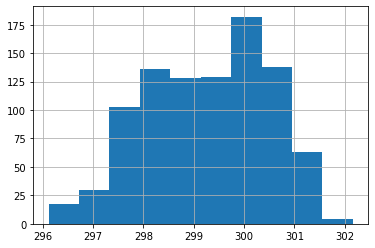

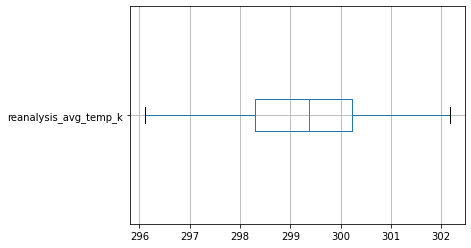

--------------------
reanalysis_dew_point_temp_k
Moyenne:
 295.1095192012262
Mediane:
 295.46428571449997
Mode:
 293.27
Variance:
 2.462071783301756
Ecart-type:
 1.5690990355301846


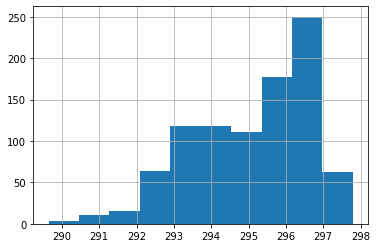

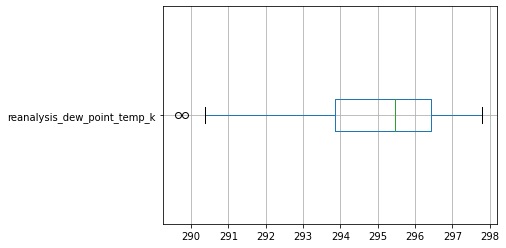

--------------------
reanalysis_max_air_temp_k
Moyenne:
 301.39881720430077
Mediane:
 301.5
Mode:
 301.8
Variance:
 1.583192149381431
Ecart-type:
 1.2582496371473473


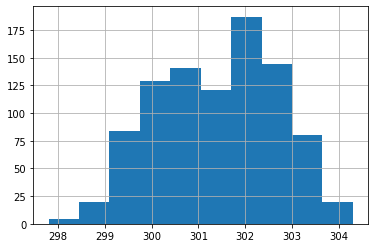

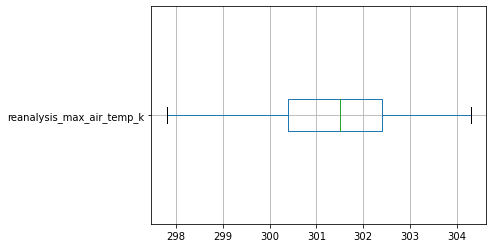

--------------------
reanalysis_min_air_temp_k
Moyenne:
 297.3018279569893
Mediane:
 297.5
Mode:
 298.0
Variance:
 1.6744590241646315
Ecart-type:
 1.2940088964781624


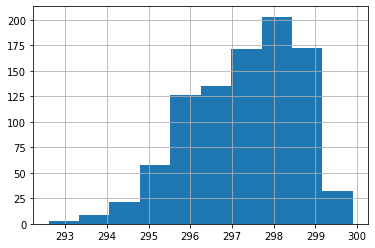

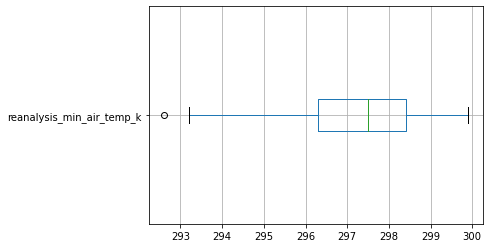

--------------------
reanalysis_precip_amt_kg_per_m2
Moyenne:
 30.4654193548387
Mediane:
 21.3
Mode:
 8.3
Variance:
 1267.9934000929593
Ecart-type:
 35.60889495748161


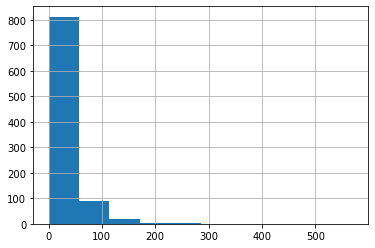

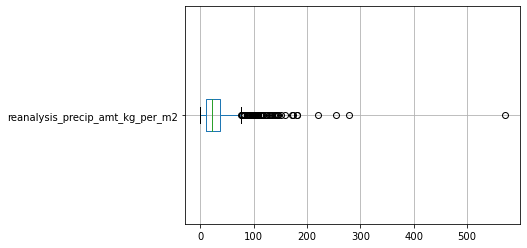

--------------------
reanalysis_relative_humidity_percent
Moyenne:
 78.56818125959921
Mediane:
 78.66785714285001
Mode:
 78.3114285714
Variance:
 11.476273418099682
Ecart-type:
 3.3876648916472956


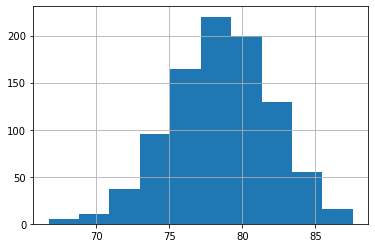

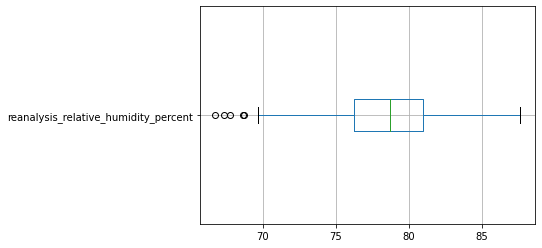

--------------------
reanalysis_sat_precip_amt_mm
Moyenne:
 35.47080906148867
Mediane:
 20.8
Mode:
 0.0
Variance:
 1987.561049722984
Ecart-type:
 44.582070944752935


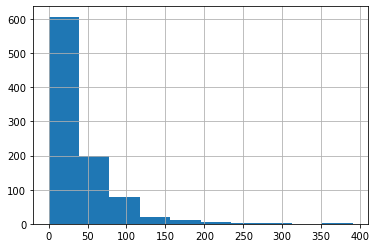

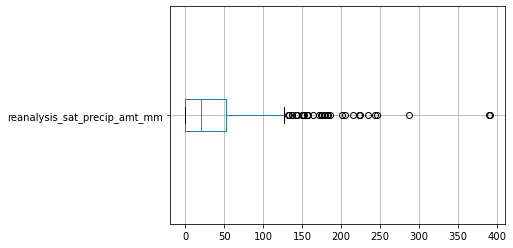

--------------------
reanalysis_specific_humidity_g_per_kg
Moyenne:
 16.552408602150322
Mediane:
 16.84571428575
Mode:
 18.0914285714
Variance:
 2.433860900409667
Ecart-type:
 1.560083619685069


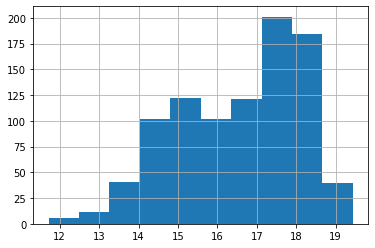

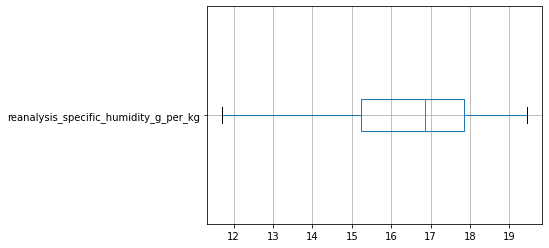

--------------------
reanalysis_tdtr_k
Moyenne:
 2.516267281105967
Mediane:
 2.45714285714
Mode:
 2.35714285714
Variance:
 0.24862521537226107
Ecart-type:
 0.4986233201247822


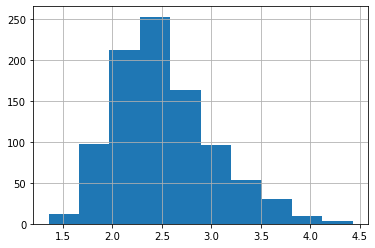

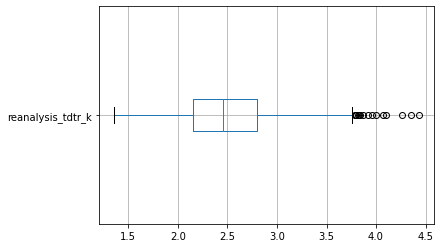

--------------------
station_avg_temp_c
Moyenne:
 27.006528417819812
Mediane:
 27.2285714286
Mode:
 28.3857142857
Variance:
 2.0014107482074457
Ecart-type:
 1.414712249260409


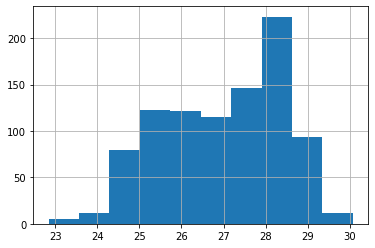

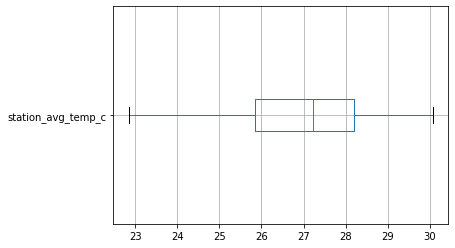

--------------------
station_diur_temp_rng_c
Moyenne:
 6.757373271889445
Mediane:
 6.75714285714
Mode:
 6.18571428571
Variance:
 0.6981322708064815
Ecart-type:
 0.8355430993111496


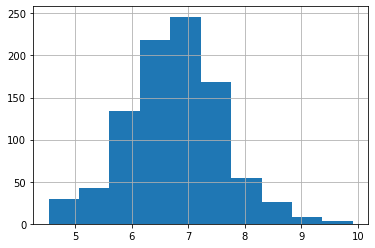

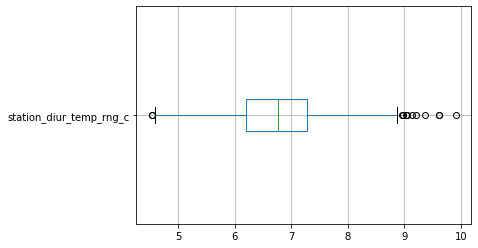

--------------------
station_max_temp_c
Moyenne:
 31.607956989247327
Mediane:
 31.7
Mode:
 32.8
Variance:
 2.9459366863221113
Ecart-type:
 1.7163731197854712


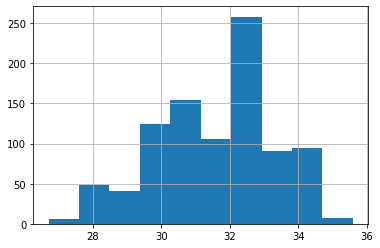

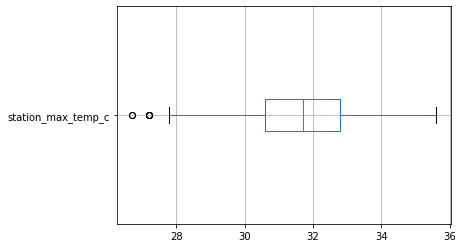

--------------------
station_min_temp_c
Moyenne:
 22.600645161290323
Mediane:
 22.8
Mode:
 23.9
Variance:
 2.2664296912937787
Ecart-type:
 1.5054666025169003


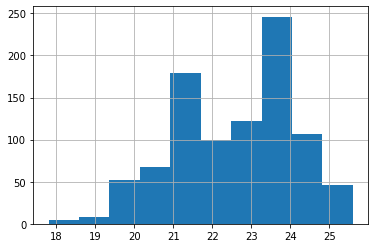

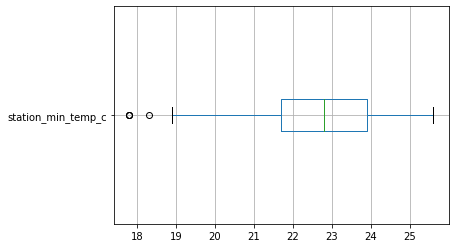

--------------------
station_precip_mm
Moyenne:
 26.785483870967713
Mediane:
 17.75
Mode:
 0.0
Variance:
 859.0784451959773
Ecart-type:
 29.310040006727682


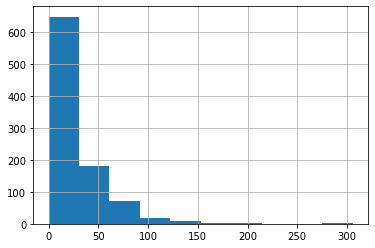

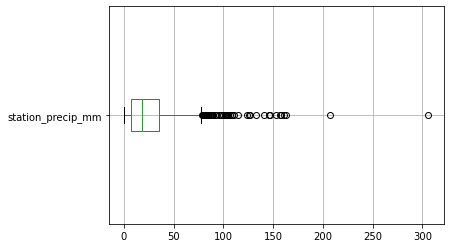

In [25]:
#Histogramme
#Nombre de classe (règle de Sturges) k=[1+log2(n)]
from math import log2
k = int(1 + log2(X_sj.shape[0]))

for var in v_quant_cont:
    print("-"*20)
    print(var)    
    print("Moyenne:\n",X_sj[var].mean())
    print("Mediane:\n",X_sj[var].median())
    print("Mode:\n",X_sj[var].mode()[0])
    print("Variance:\n",X_sj[var].var(ddof=0))
    print("Ecart-type:\n",X_sj[var].std(ddof=0))
    X_sj[var].hist(bins=k)
    plt.show()
    X_sj.boxplot(column=var, vert=False)
    plt.show()


--------------------
ndvi_ne
Moyenne:
 0.26386947294003865
Mediane:
 0.2636429
Mode:
 0.2278714
Variance:
 0.0066083014358573125
Ecart-type:
 0.08129145979656972


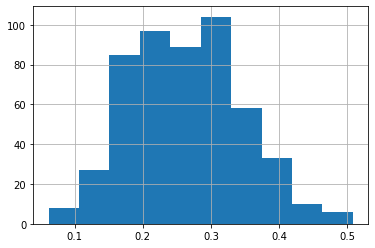

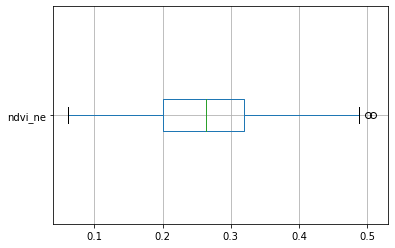

--------------------
ndvi_nw
Moyenne:
 0.23878288858800772
Mediane:
 0.2329714
Mode:
 0.2278571
Variance:
 0.00587939829633913
Ecart-type:
 0.07667723453763269


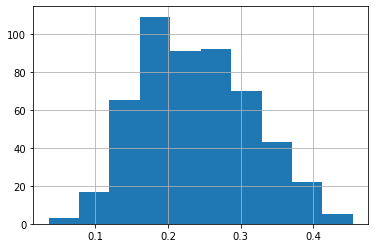

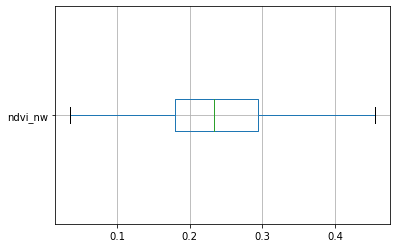

--------------------
ndvi_se
Moyenne:
 0.25012628506769824
Mediane:
 0.2498
Mode:
 0.2203
Variance:
 0.005972044490734862
Ecart-type:
 0.07727900420382539


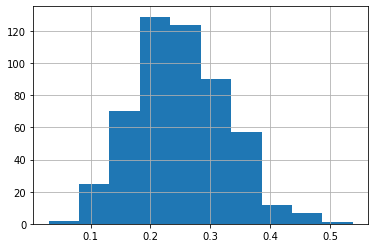

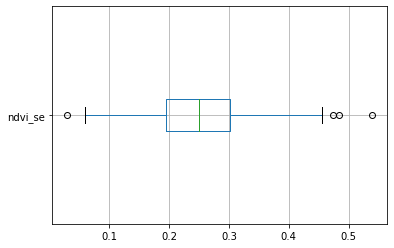

--------------------
ndvi_sw
Moyenne:
 0.2667788294197291
Mediane:
 0.2621429
Mode:
 0.1994714
Variance:
 0.007441044945478167
Ecart-type:
 0.08626149167199793


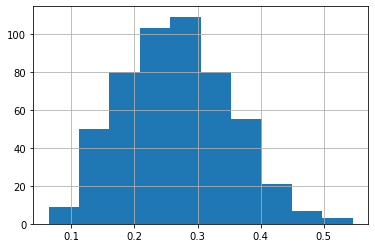

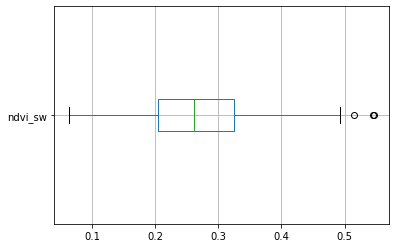

--------------------
precipitation_amt_mm
Moyenne:
 64.2457364341086
Mediane:
 60.47
Mode:
 0.0
Variance:
 1237.9737663181302
Ecart-type:
 35.184851375529924


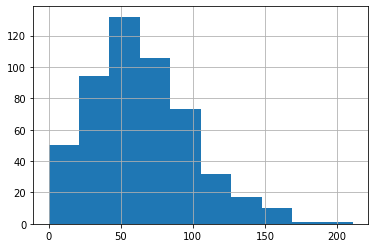

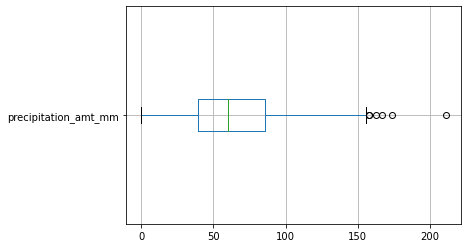

--------------------
reanalysis_air_temp_k
Moyenne:
 297.8695376522928
Mediane:
 297.82285714299996
Mode:
 297.64
Variance:
 1.3685764315497726
Ecart-type:
 1.1698617147123727


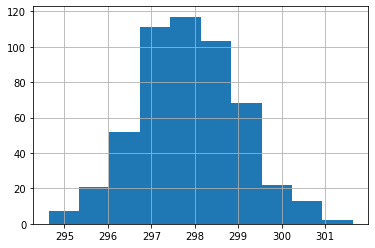

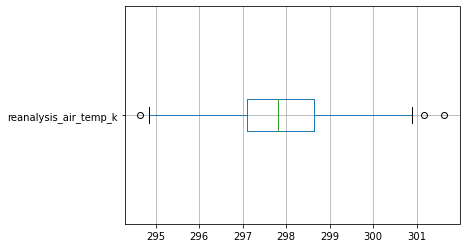

--------------------
reanalysis_avg_temp_k
Moyenne:
 299.1330426356548
Mediane:
 299.1214285715
Mode:
 297.521428571
Variance:
 1.7709797512600038
Ecart-type:
 1.3307816316962013


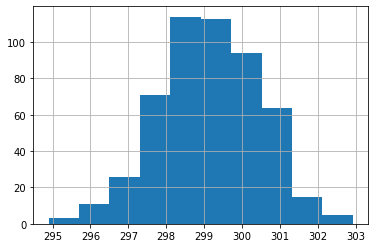

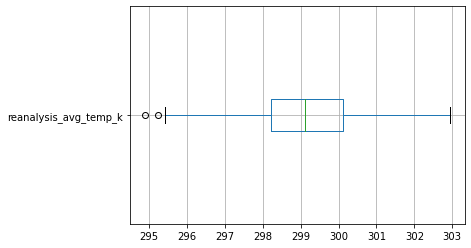

--------------------
reanalysis_dew_point_temp_k
Moyenne:
 295.49298172757784
Mediane:
 295.852142857
Mode:
 296.388571429
Variance:
 2.004646413028398
Ecart-type:
 1.4158553644452523


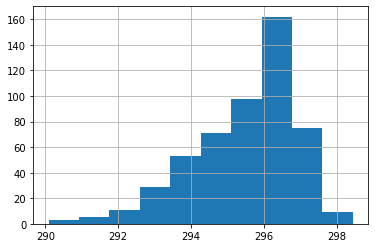

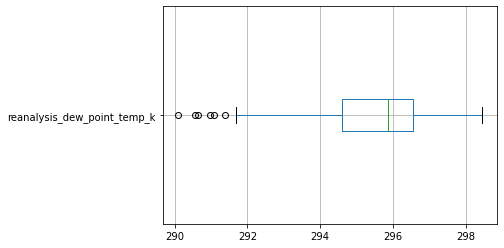

--------------------
reanalysis_max_air_temp_k
Moyenne:
 307.0827519379847
Mediane:
 307.05
Mode:
 304.4
Variance:
 5.667590101255929
Ecart-type:
 2.380670095006011


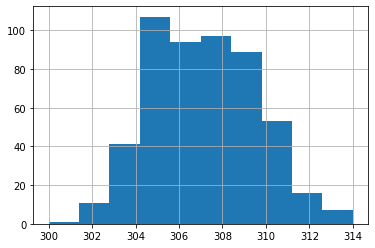

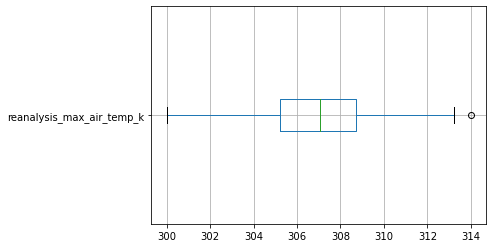

--------------------
reanalysis_min_air_temp_k
Moyenne:
 292.86666666666656
Mediane:
 293.05
Mode:
 294.3
Variance:
 2.7604392764857897
Ecart-type:
 1.6614569740097964


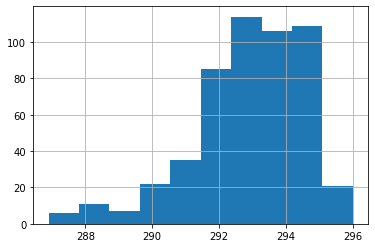

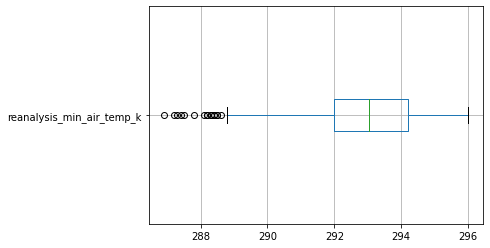

--------------------
reanalysis_precip_amt_kg_per_m2
Moyenne:
 57.609864341085306
Mediane:
 46.44
Mode:
 23.6
Variance:
 2523.836942423455
Ecart-type:
 50.237803917204175


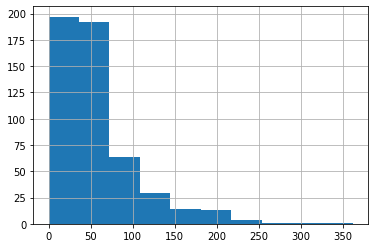

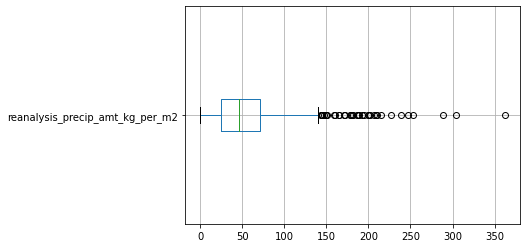

--------------------
reanalysis_relative_humidity_percent
Moyenne:
 88.63911683277843
Mediane:
 90.91714285715
Mode:
 86.7557142857
Variance:
 57.40391019532744
Ecart-type:
 7.576536820693703


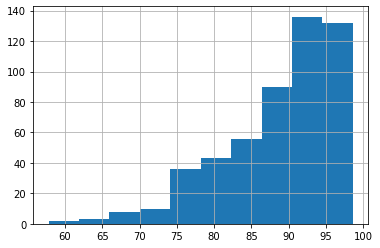

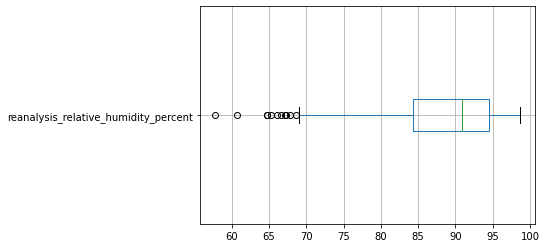

--------------------
reanalysis_sat_precip_amt_mm
Moyenne:
 64.2457364341086
Mediane:
 60.47
Mode:
 0.0
Variance:
 1237.9737663181302
Ecart-type:
 35.184851375529924


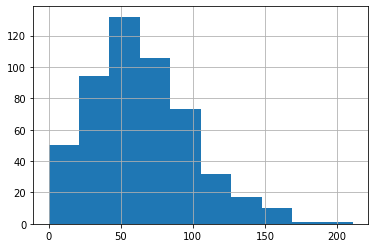

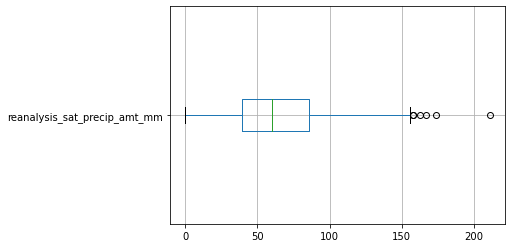

--------------------
reanalysis_specific_humidity_g_per_kg
Moyenne:
 17.096110188261807
Mediane:
 17.42857142855
Mode:
 18.4842857143
Variance:
 2.0861967939033548
Ecart-type:
 1.4443672642037255


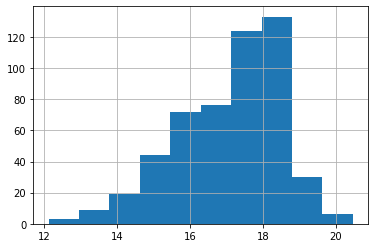

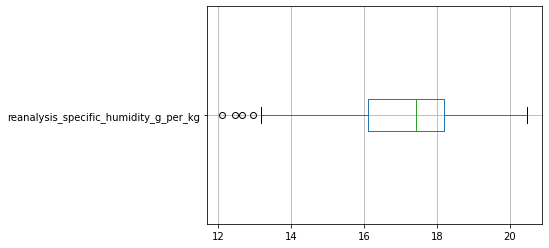

--------------------
reanalysis_tdtr_k
Moyenne:
 9.206782945735911
Mediane:
 8.964285714285
Mode:
 7.38571428571
Variance:
 5.983653960004673
Ecart-type:
 2.446150845717548


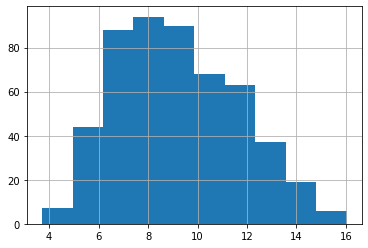

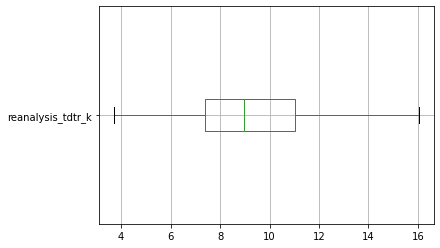

--------------------
station_avg_temp_c
Moyenne:
 27.5309326629205
Mediane:
 27.6
Mode:
 28.0
Variance:
 0.8478981036279023
Ecart-type:
 0.9208138268010001


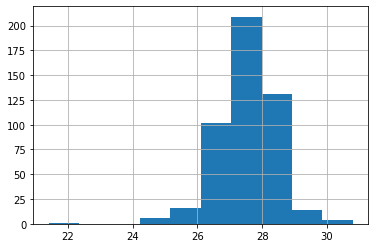

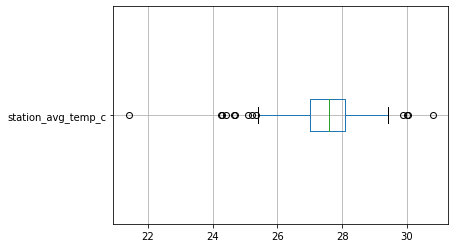

--------------------
station_diur_temp_rng_c
Moyenne:
 10.566197377500918
Mediane:
 10.625
Mode:
 9.5
Variance:
 2.3528665154444597
Ecart-type:
 1.533905640984627


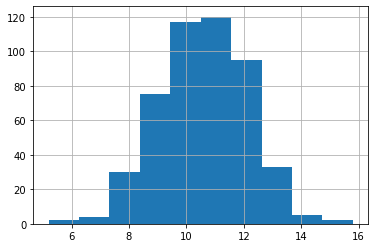

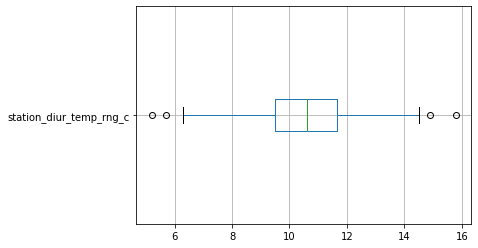

--------------------
station_max_temp_c
Moyenne:
 34.00454545454547
Mediane:
 34.0
Mode:
 34.0
Variance:
 1.752844951491197
Ecart-type:
 1.3239505094569046


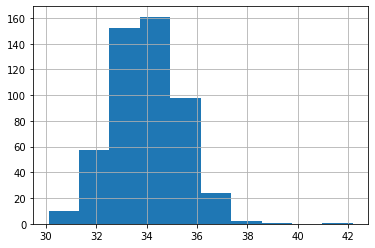

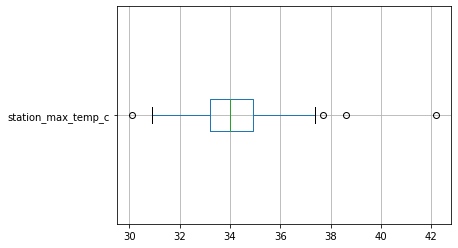

--------------------
station_min_temp_c
Moyenne:
 21.196679687500005
Mediane:
 21.3
Mode:
 21.0
Variance:
 1.5853210067749024
Ecart-type:
 1.2590953128238158


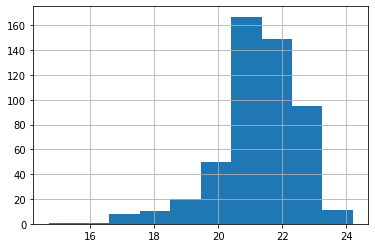

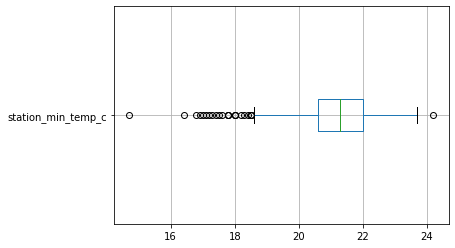

--------------------
station_precip_mm
Moyenne:
 62.46726190476186
Mediane:
 45.3
Mode:
 0.0
Variance:
 3992.1146226615638
Ecart-type:
 63.18318306845235


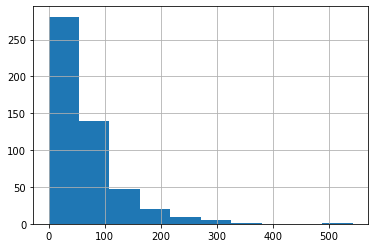

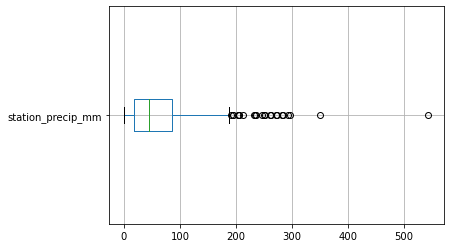

In [26]:
#Histogramme
#Iquitos
#Nombre de classe (règle de Sturges) k=[1+log2(n)]
k = int(1 + log2(X_sj.shape[0]))

for var in v_quant_cont:
    print("-"*20)
    print(var)    
    print("Moyenne:\n",X_iq[var].mean())
    print("Mediane:\n",X_iq[var].median())
    print("Mode:\n",X_iq[var].mode()[0])
    print("Variance:\n",X_iq[var].var(ddof=0))
    print("Ecart-type:\n",X_iq[var].std(ddof=0))
    X_iq[var].hist(bins=k)
    plt.show()
    X_iq.boxplot(column=var, vert=False)
    plt.show()
#--Analyse à faire

## Variable quantitative discrete

--------------------
total_cases
Moyenne:
 34.18055555555556
Mediane:
 19.0
Mode:
 6
Variance:
 2637.2248783238533
Ecart-type:
 51.353917847851235


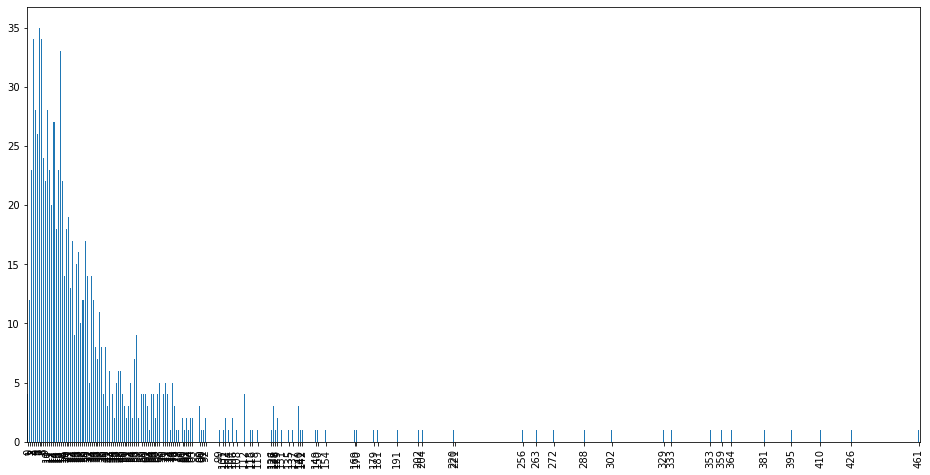

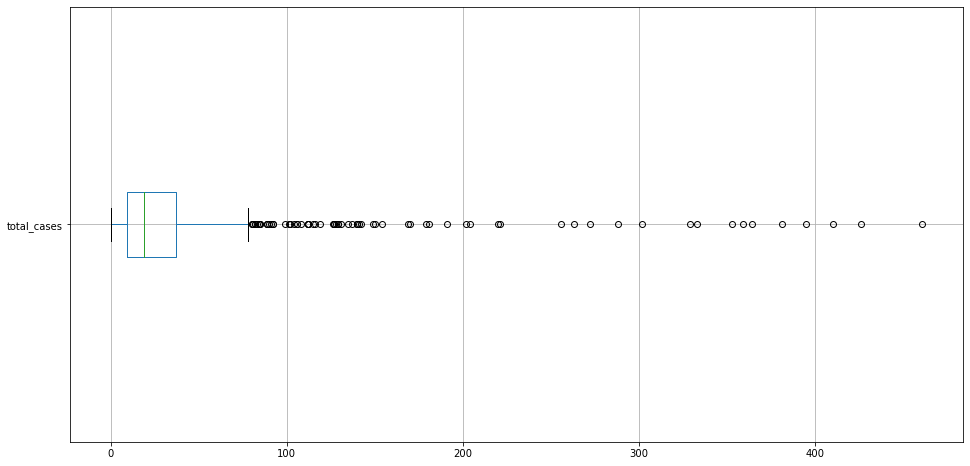

In [27]:
#San Juan
#Diagramme en bâtons

for var in v_quant_disc:
    print("-"*20)
    print(var)    
    print("Moyenne:\n",X_sj[var].mean())
    print("Mediane:\n",X_sj[var].median())
    print("Mode:\n",X_sj[var].mode()[0])
    print("Variance:\n",X_sj[var].var(ddof=0))
    print("Ecart-type:\n",X_sj[var].std(ddof=0))
    plt.figure(figsize=(16,8))
    X_sj[var].value_counts().sort_index().plot(kind='bar')
    plt.show()
    plt.figure(figsize=(16,8))
    X_sj.boxplot(column=var, vert=False)
    plt.show()
#--Analyse à faire
#Nous voici arriver à notre variable cible, le nombre de cas de dengue par semaine.
#--Analyse à faire

--------------------
total_cases
Moyenne:
 7.565384615384615
Mediane:
 5.0
Mode:
 0
Variance:
 115.6726479289938
Ecart-type:
 10.755121939289847


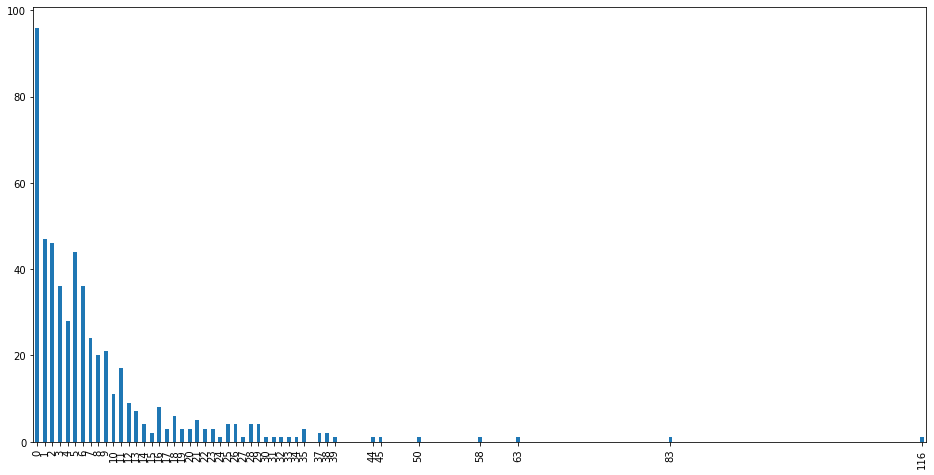

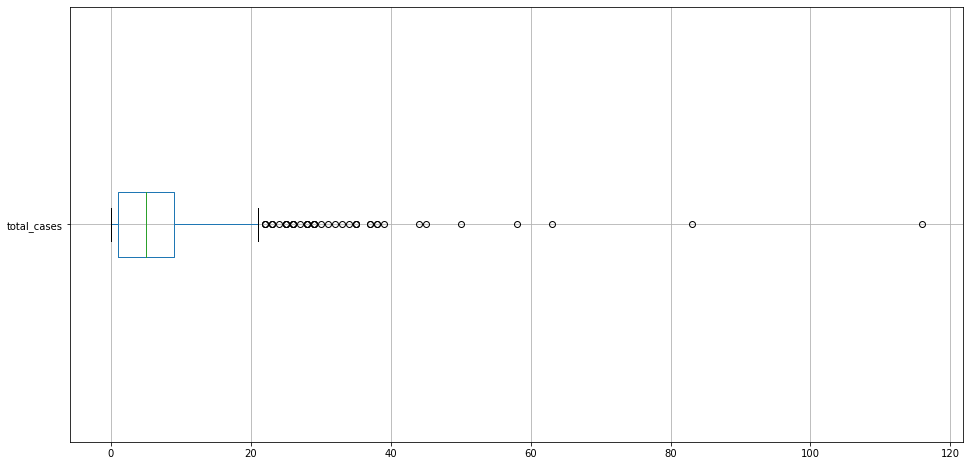

In [28]:
#Iquitos
#Diagramme en bâtons

for var in v_quant_disc:
    print("-"*20)
    print(var)    
    print("Moyenne:\n",X_iq[var].mean())
    print("Mediane:\n",X_iq[var].median())
    print("Mode:\n",X_iq[var].mode()[0])
    print("Variance:\n",X_iq[var].var(ddof=0))
    print("Ecart-type:\n",X_iq[var].std(ddof=0))
    plt.figure(figsize=(16,8))
    X_iq[var].value_counts().sort_index().plot(kind='bar')
    plt.show()
    plt.figure(figsize=(16,8))
    X_iq.boxplot(column=var, vert=False)
    plt.show()
#Nous voici arriver à notre variable cible, le nombre de cas de dengue par semaine.
#on voit que la varible cible contient énormement de données aberante

## Analyse bivariée

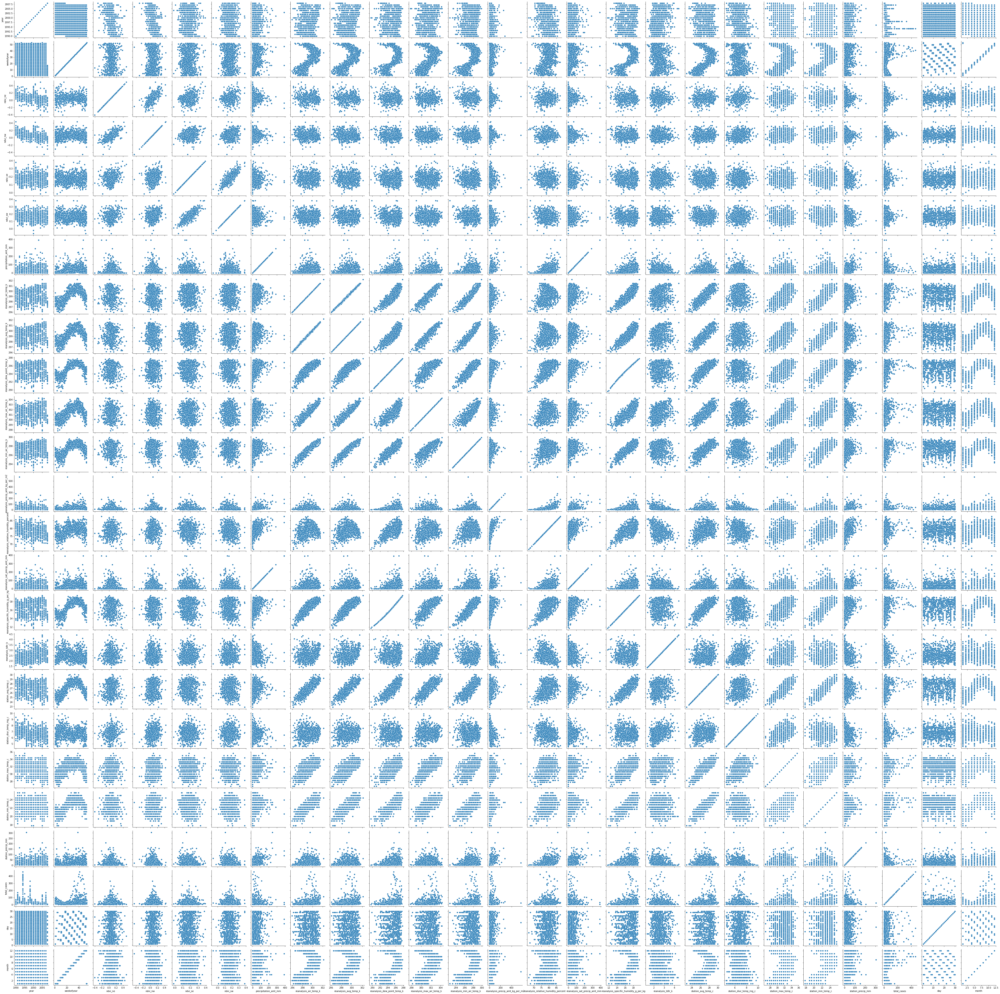

In [29]:
import seaborn as sns
g = sns.PairGrid(X_sj)
g.map(sns.scatterplot)
plt.show()
#Malheureusement il y a beaucoup trop de variable pour que seaborn ne les affiche correctement, cependant nous remarquons quelque forte corrélation entre certaine variable, ces correlation pourraient servir lorseque nous voudrons faire des combinaiseon de variable 

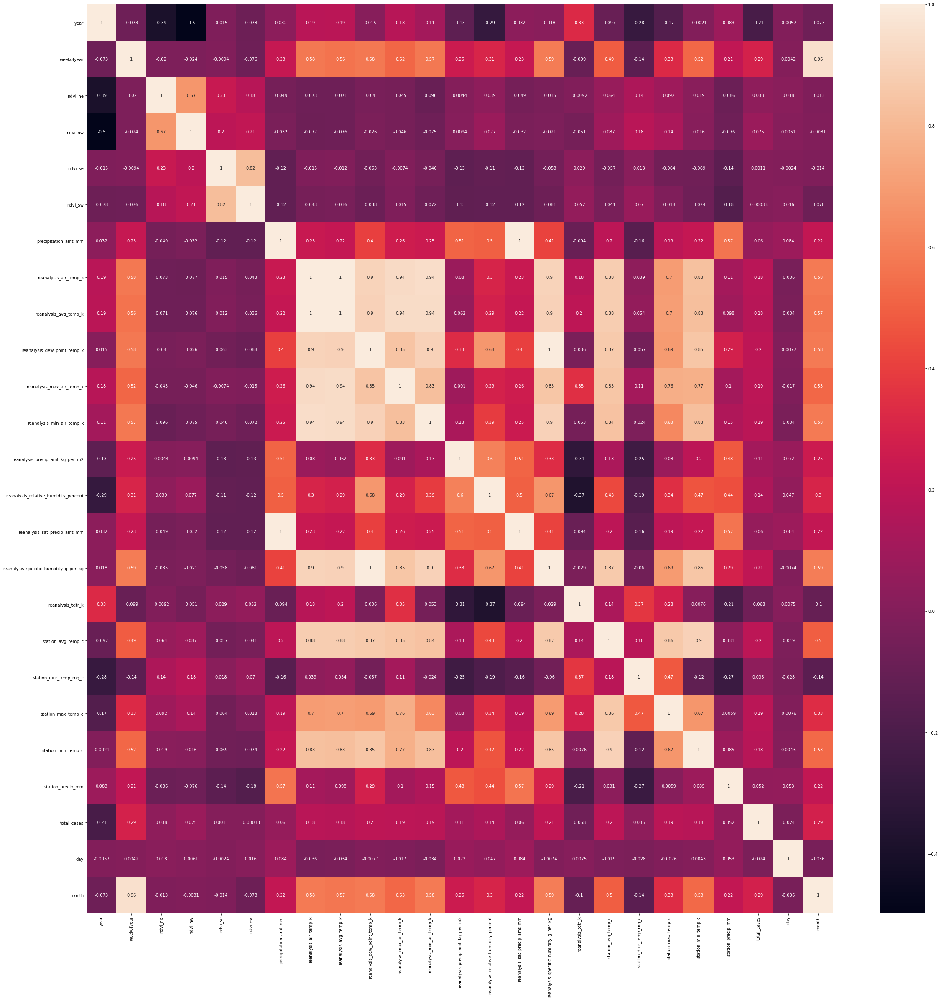

In [30]:
# calculate correlation matrix
plt.figure(figsize=(40,40))
corr_sj = X_sj.corr()# plot the heatmap
sns.heatmap(corr_sj, xticklabels=corr_sj.columns, yticklabels=corr_sj.columns, annot=True)
plt.show()

## Analyse de la variable cible (total_cases)

### Correlation de la variable cible avec les autres variables

In [31]:
#Interessons nous maintenant aux correlation entre notre variable à predir (total_cases) et les autres variables.

In [32]:
X_sj.corr()['total_cases'].sort_values(ascending=False)
#Aucune variable ne semble etre particulierement corrélé
#Les variables les plus corrélé sont les variable temporelle (weekofyear, month year qui est négativment correlé), ensuite viennent des variable environnmental telle que (...)
#Certaine variable ont une correlation linéaire tres faible, mais cela ne veut pas dire qu'il n y a pas de lien.

total_cases                              1.000000
weekofyear                               0.287134
month                                    0.285754
reanalysis_specific_humidity_g_per_kg    0.207947
reanalysis_dew_point_temp_k              0.203774
station_avg_temp_c                       0.196617
reanalysis_max_air_temp_k                0.194532
station_max_temp_c                       0.189901
reanalysis_min_air_temp_k                0.187943
reanalysis_air_temp_k                    0.181917
station_min_temp_c                       0.177012
reanalysis_avg_temp_k                    0.175267
reanalysis_relative_humidity_percent     0.144045
reanalysis_precip_amt_kg_per_m2          0.107457
ndvi_nw                                  0.075307
reanalysis_sat_precip_amt_mm             0.060211
precipitation_amt_mm                     0.060211
station_precip_mm                        0.051759
ndvi_ne                                  0.037639
station_diur_temp_rng_c                  0.034630


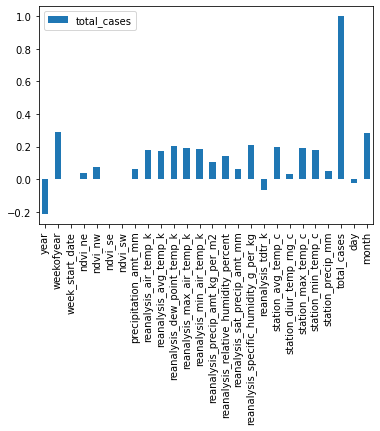

In [33]:
pd.DataFrame(X_sj.corr()['total_cases'].sort_values(ascending=False)
, index=X_sj.columns).plot.bar()
plt.show()

## Analyse "temporelle" de la variable cible

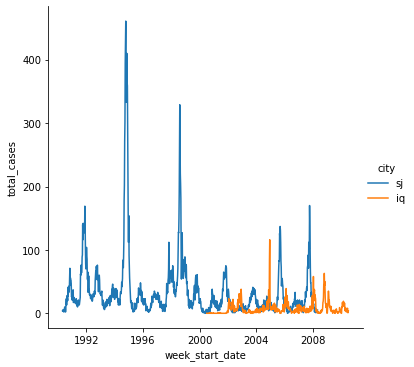

In [34]:
#comparaison iq et sj 
sns.relplot(x="week_start_date", y="total_cases", hue="city", kind="line", data=X)
plt.show()
#La courbe de San Juan s'étends sur une plage d'année plus grande que celle d'Iquitos
#nous pouvons également observer qu'il y a des piques plus grand du coté de San Juan avec un nombre de cas pouvant dépasser les 400, celle de la courbes d'iquitos dépasse à peine les 100 cas par semains
#Tendance saisonalité voir vocabulaire EDA temporelle

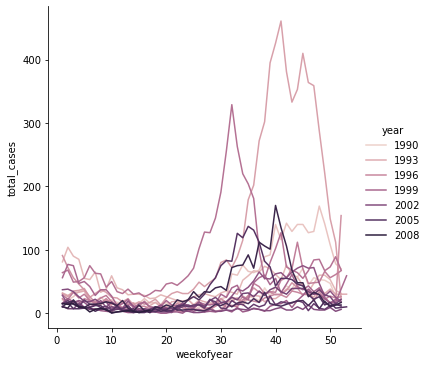

In [35]:
#comparaison des courbe de contamination par années (week_of year)
sns.relplot(x="weekofyear",  y="total_cases", hue="year", kind="line", data=X_sj)
plt.show()
#décrire saisonalité blabla
#meme chose pour Iquitos

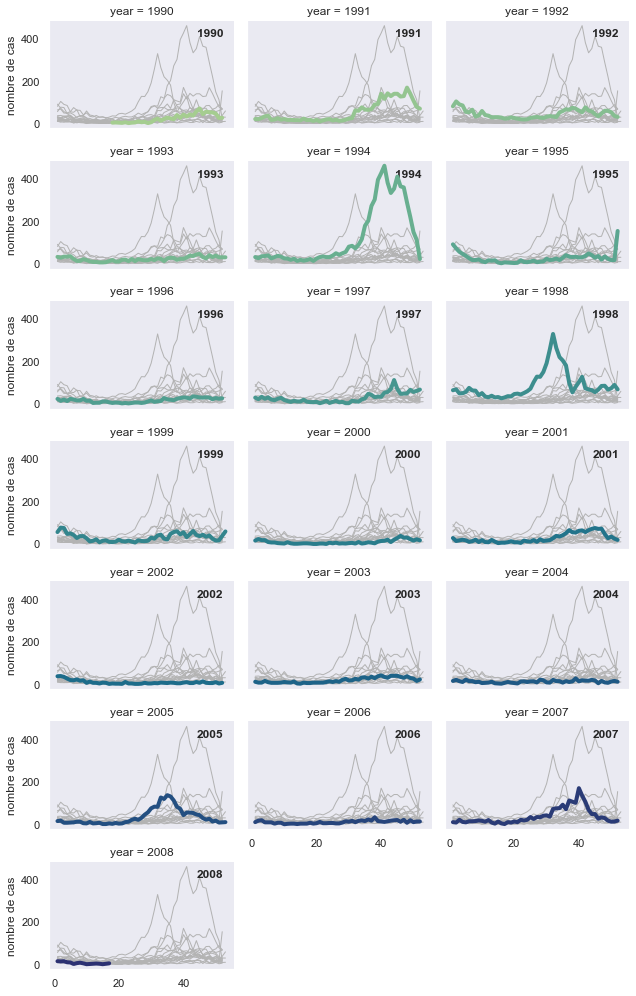

In [36]:
sns.set_theme(style="dark")

# Plot each year's time series in its own facet
g = sns.relplot(
    data=X_sj,
    x="weekofyear", y="total_cases", col="year", hue="year",
    kind="line", palette="crest", linewidth=4, zorder=5,
    col_wrap=3, height=2, aspect=1.5, legend=False,
)

for year, ax in g.axes_dict.items():

    # Add the title as an annotation within the plot
    ax.text(.8, .85, year, transform=ax.transAxes, fontweight="bold")

    # Plot every year's time series in the background
    sns.lineplot(
        data=X_sj, x="weekofyear", y="total_cases", units="year",
        estimator=None, color=".7", linewidth=1, ax=ax,
    )
# Reduce the frequency of the x axis ticks
#ax.set_xticks(ax.get_xticks()[::2])

# Tweak the supporting aspects of the plot
#g.set_titles("Evolution des nombres de cas")
g.set_axis_labels("", "nombre de cas")
g.tight_layout()

#OBSERVATION: chaque fin d'année, le nombre de cas augmente.

In [37]:
import numpy as np
X_sj.groupby('year').agg(total_case_sum = pd.NamedAgg(column='total_cases', aggfunc=np.mean))

,total_case_sum
year,
1990,24.742857
1991,53.865385
1992,45.596154
1993,22.230769
1994,125.634615
1995,25.634615
1996,16.442308
1997,27.961538
1998,88.365385


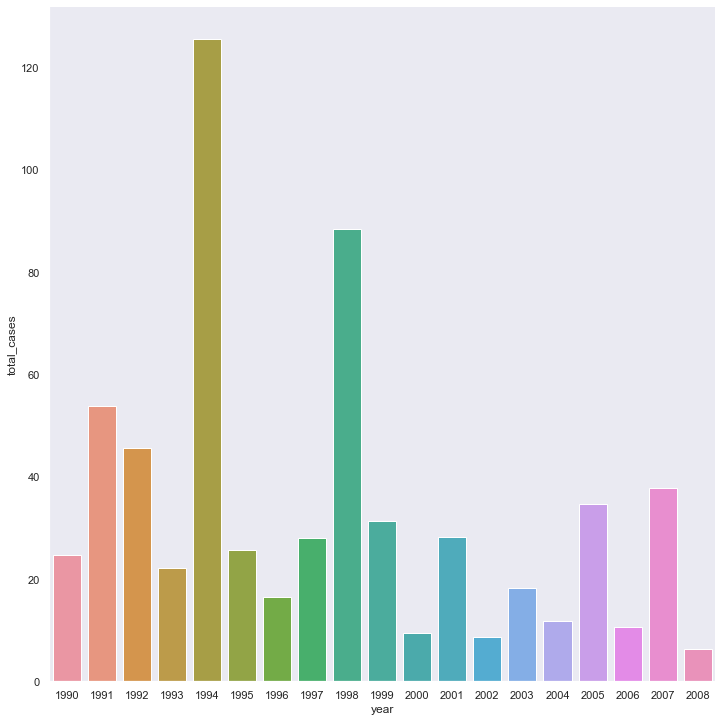

In [38]:
sns.catplot(x='year',y='total_cases',data= X_sj, estimator=np.mean, kind='bar', ci= None, height=10)
plt.show()
#Le nombre moyen de cas par années ne semble pas suivre une tendance particulier...
#Valeur aberrante 1994 (qui sort su lot)

In [39]:
import numpy as np
#interessons nous à la moyennes des cas détecté tout les mois, cela nous permettra de détecté une saisonalité...
X_sj.groupby('month').agg(total_case_sum = pd.NamedAgg(column='total_cases', aggfunc=np.mean))
#Observation : le nombre de cas commence à augmenter dés le mois de mai pour atteindre un pique au mois d'octobre avec une moyenne de 71 cas détécté, ensuite le nombre de cas diminue peu à peu

,total_case_sum
month,
1,31.422222
2,21.097222
3,14.597222
4,10.022222
5,11.138889
6,16.319444
7,27.355556
8,48.041667
9,55.750000


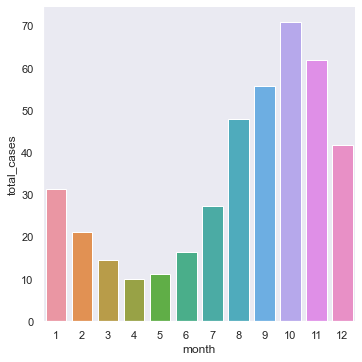

In [40]:
sns.catplot(x='month',y='total_cases',data= X_sj, estimator=np.mean, kind='bar', ci= None)
plt.show()

In [41]:
#Faisons la meme chose avec les semaines de l'année nous aurons des indications plus precise sur la saisonalité ...
X_sj.groupby('weekofyear').agg(total_case_sum = pd.NamedAgg(column='total_cases', aggfunc=np.mean))
#Observation : le nombre de cas commence à augmenter dés le mois de mai pour atteindre un pique au mois d'octobre avec une moyenne de 71 cas détécté, ensuite le nombre de cas diminue peu à peu

,total_case_sum
weekofyear,
1,32.500000
2,32.777778
3,31.611111
4,27.444444
5,26.222222
6,21.611111
7,20.333333
8,20.055556
9,19.000000


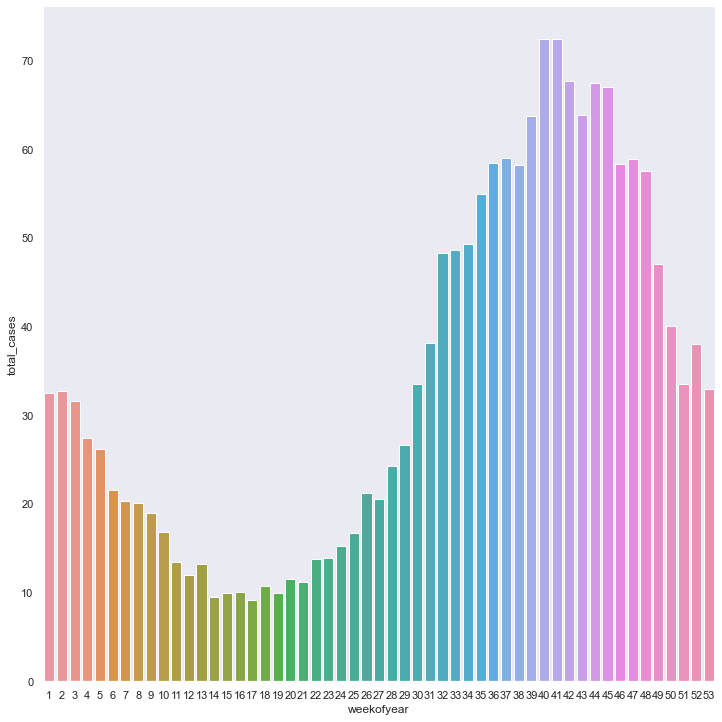

In [42]:
sns.catplot(x='weekofyear',y='total_cases',data= X_sj, estimator=np.mean, kind='bar', ci= None, height=10)
plt.show()
#Sur ce graphique nous remarquons encore plus cette saisonalité...
#Vers la vintieme semaines commence à augmenter jusqu'a connaitre un pique vers la quarantieme semaine avec une moyenne de 72,4 cas par semaine

# Preparer les données

In [43]:
X_train = features_train.copy()
y_train = labels_train.copy()
X_test = features_test.copy()
sub_format = submission_format.copy()

#Dans cette étape je vais essayer de créer une pipeline, c'est à dire une suite de transformateur pour faire en sort que quand je passerai des données dans cette pipeline, ces données seront automatiquement preparé pour les algorithme d'apprentissage machine.
#la pipeline devra:
"""
1.	Nettoyer les données :
    o	corriger ou supprimer les données aberrantes (facultatif)
    o	 remplacer les données manquantes (par des zéros, la moyenne, la médiane etc.) ou bien supprimer les observations ou les variables correspondantes.
2.	Sélectionner les variables (facultatif)
    o	en éliminant celles qui ne fournissent pas d'information utile pour cette tâche.
3.	Transformer au besoin les variables :
    o	transformer certaines variables continue en variables discrètes (ou qualitatives)
    o	décomposer les variables (p. ex, variables qualitatives, date et heure, etc.)
    o	appliquer certaines transformations prometteuses aux variables (p. ex. log(x), sqrt(x), x², etc.) ;
    o	combiner plusieurs variables en une nouvelle variable plus intéressante.
4.	Recalibrer les variables
    •	normalisation ou transformation min-max.
"""

## Nettoyer les données

### Les valeurs aberrantes
- cette partie ne sera pas traiter pour voir comment les differents algorithmes réagissent à ces valeurs abérrantes

### Les données manquantes

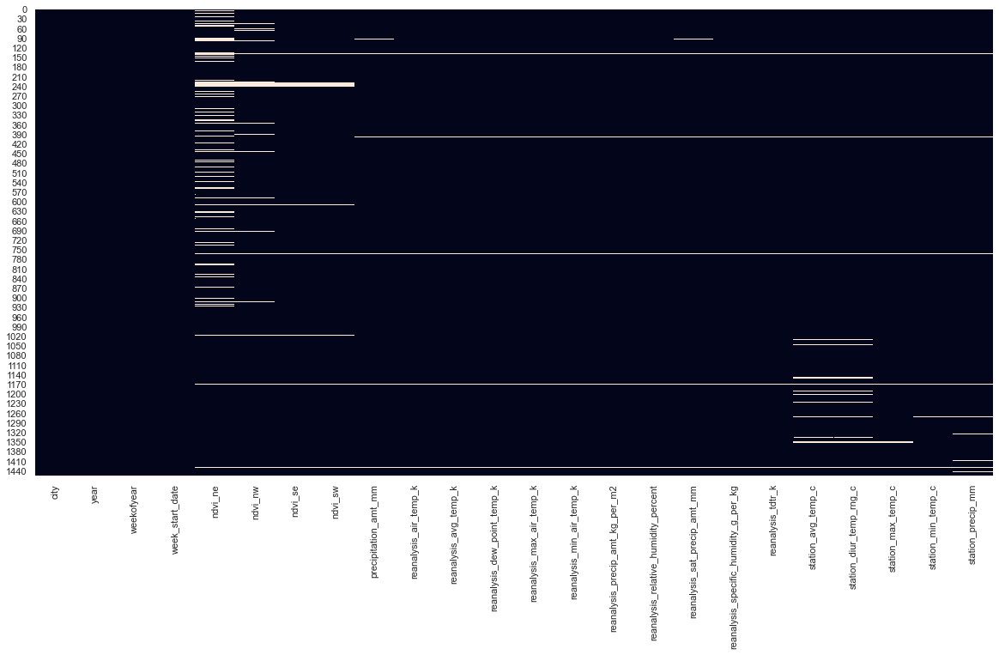

In [44]:
plt.figure(figsize=(20,10))
sns.heatmap(X_train.isna(),cbar=False)
plt.show()
#Les cases blanche sont des valeur manquante
#Sous la forme NaN
#ndvi_ne semble avoir pas mal de données manquante, evaluer son importance pour voir si il faut la supprimer ou pas
#Les longues lignes blanche horizontale correspondent a des observations (des semaines) contenant presque que des valeur manquante, il semble que les données meteorologique n'ont pas été relevé pour ces semaines. il faudra penser à les supprimer tout simplement car elle ne sont pas exploitable, de plus, elle sont peu nombreuse.
#peut etre creer une fonction qui supprime des observation contenant > % de données manquantes
# pour le reste des données manquante nous tenterons de les remplacer pour ne pas perdre trop de donnée en supprimant simplement les observations, nous les remplacerons soit par la moyenne, la mediane...

In [45]:
(X_train.isna().sum()/X_train.shape[0]).sort_values(ascending=False)

ndvi_ne                                  0.133242
ndvi_nw                                  0.035714
station_diur_temp_rng_c                  0.029533
station_avg_temp_c                       0.029533
station_precip_mm                        0.015110
ndvi_se                                  0.015110
ndvi_sw                                  0.015110
station_max_temp_c                       0.013736
station_min_temp_c                       0.009615
precipitation_amt_mm                     0.008929
reanalysis_sat_precip_amt_mm             0.008929
reanalysis_relative_humidity_percent     0.006868
reanalysis_tdtr_k                        0.006868
reanalysis_specific_humidity_g_per_kg    0.006868
reanalysis_max_air_temp_k                0.006868
reanalysis_precip_amt_kg_per_m2          0.006868
reanalysis_min_air_temp_k                0.006868
reanalysis_dew_point_temp_k              0.006868
reanalysis_avg_temp_k                    0.006868
reanalysis_air_temp_k                    0.006868


In [46]:
# il y a environ 13% de valeurs manquante, je prefere la supprimer pour ne par prendre le risque de remplacer ses valeurs manquante par des données non representatifs et fausser les prediciton

#X_train_prep = X_train.drop(columns='ndvi_ne')
#X_train_prep

In [47]:
#Les longues lignes blanche horizontale correspondent a des observations (des semaines) contenant presque que des valeur manquante, il semble que les données meteorologique n'ont pas été relevé pour ces semaines. il faudra penser à les supprimer tout simplement car elle ne sont pas exploitable, de plus, elle sont peu nombreuse.
#peut etre creer une fonction qui supprime des observation contenant > % de données manquantes

#X_train_prep = X_train_prep.dropna(axis=0,thresh=16)
#X_train_prep

In [48]:
# pour le reste des données manquante nous tenterons de les remplacer pour ne pas perdre trop de donnée en supprimant simplement les observations, nous les remplacerons soit par la moyenne, la mediane...
# Pour l'instant je décide de remplacer les valeurs manquante en utilisant la methode ffill qui consiste
#  remplissage : propagation de la dernière observation valable au prochain remplissage valable 

#X_train_prep = X_train_prep.fillna(method='ffill')#pratique pour els série temporelle

In [49]:
#Afin que cette étape de preparation soit facilement integrable a ma pipeline finale, je l'ai transformer en un transformer scikit-learn
from sklearn.base import BaseEstimator, TransformerMixin

class preprocess_nan(BaseEstimator, TransformerMixin):
    def __init__(self):
        #print('\n>>>>>>>init() called.\n')
        return None

    def fit(self, X, y = None):
        #print('\n>>>>>>>fit() called.\n')
        return self

    def transform(self, X, y = None):
        #print('\n>>>>>>>transform() called.\n')
        X_ = X.copy() 
        X_ = X_.drop(columns='ndvi_ne')#Supprime la colonne ndvi_ne (trop de valeurs manquante)
        X_ = X_.fillna(method='ffill')#propagation de la dernière observation valable au prochain remplissage valable 
        return X_

In [50]:
#plt.figure(figsize=(20,10))
#sns.heatmap(X_train_prep.isna(),cbar=False)
#plt.show()
#toute les cases sont noire, nous n'avons plus de cases blanche donc plus de valeurs manquantes
#verifier plus tard dans le code apres pipeline

In [51]:
#print('jeu de données originelle: ',X_train.shape)
#print('Apres traitement des NaN: ',X_train_prep.shape)
#nous avons perdu une variable et dix lignes, le but est de tenter de conserver un maximumn de données pour les algorithme d'apprentissage machine

## Selection de variable

- le but de cette comparaison est de faire le minimun de pretraitement, la selection des variable n'est pas une phase de pretraitement sans laquelle les algorithme ne pourrait pas tourner

## Transformation des variable

### traitement des variable categorique
- Malheureusement, la bibliothèque d'apprentissage automatique de sklearn ne permet pas de traiter les données catégorielles. Même pour les modèles arborescents, il est nécessaire de convertir les caractéristiques catégorielles en une représentation numérique.
- la seule variable catergorique : 'city
- c'est une variable categorque de type nominale ( et non ordinal)
- utilisation de OneHotEncoder 

In [52]:
from sklearn.preprocessing import OneHotEncoder

### Discretisation des variable continue
- cette étape n'est également pas necessaire a l'execution des algorithme
- discretization 
    - augmente les perfomance des modele basé sur les arbre
    - strategy = uniform sensible aux données aberante
- Binarisation
    - remplace par une valeur boolenne avec seuil
    - sert pour le featuring engineering pour creer de nouvelle variable

### Traitment de la variable date (week_start_date )

In [53]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, FunctionTransformer
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.compose import ColumnTransformer, make_column_transformer

In [54]:
#Créons une méthode to_datetime_tr, c'est un transformateur sklearn qui nous servira à automatiser la conversion de la variable 'week_start_date' d'object à "datetime".
#Ce format rend les variable de type date plus manipulable et me permettera plus tard à décomposer la date en trois nouvelle variable (day,month,year)
from sklearn.base import BaseEstimator, TransformerMixin

class to_datetime_tr(BaseEstimator, TransformerMixin):
    def __init__(self):
        #print('\n>>>>>>>init() called.\n')
        return None

    def fit(self, X, y = None):
        #print('\n>>>>>>>fit() called.\n')
        return self

    def transform(self, X, y = None):
        #print('\n>>>>>>>transform() called.\n')
        X_ = X.copy()
        X_.week_start_date = pd.to_datetime(X_.week_start_date, format='%Y-%m-%d')
        return X_


In [55]:
class split_datetime_tr(BaseEstimator, TransformerMixin):
    def __init__(self):
        #print('\n>>>>>>>init() called.\n')
        return None

    def fit(self, X, y = None):
        #print('\n>>>>>>>fit() called.\n')
        return self

    def transform(self, X, y = None):
        #print('\n>>>>>>>transform() called.\n')
        X_ = X.copy() #Creer une copie pour eviter l'alteration du jeu original
        X_["day"]= X_.week_start_date.dt.day
        X_["month"]= X_.week_start_date.dt.month
        return X_

In [56]:
#drop week_start_date
class drop_datetime_tr(BaseEstimator, TransformerMixin):
    def __init__(self):
        #print('\n>>>>>>>init() called.\n')
        return None

    def fit(self, X, y = None):
        #print('\n>>>>>>>fit() called.\n')
        return self

    def transform(self, X, y = None):
        #print('\n>>>>>>>transform() called.\n')
        X_ = X.copy() #Creer une copie pour eviter l'alteration du jeu original
        X_ = X_.drop('week_start_date', axis=1)#Supprime la colonne 'week_start_date' apres le split
        #print(X_.info())
        return X_

### combinaison de variables

In [57]:
#Meme chose pour la combinaison des variables, pas vitale pour l'execution 

## Recalibrer les variables
### standardisation
- Min-Max fonctionne bien qd la distribustion n'est pas gaussienne ou ecart type tres faible (min-max à definir)
- RobustScaler pour les données abérante

### Normalisation

In [58]:
# La plupart des modele se montre plus performant avec des données recalibrer
#J'ai choisi la normalisation plutot que le transformateur min-max
#pk?
#parce que c'est la plus classique


## Les pipelines

In [59]:
from sklearn.pipeline import Pipeline

In [60]:
date_pipeline = Pipeline(steps=[
                       ('to_datetime', to_datetime_tr()),
                       ('split_datetime', split_datetime_tr()),
                       ('drop_datetime',drop_datetime_tr())
])

In [61]:
#Pipeline pour les variable numerique
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.preprocessing import StandardScaler

numerical_pipeline = Pipeline([
    ('std_scaler', StandardScaler())])#Standardisation des variable numerique


In [62]:
#Pipeline pour les variable catégorique
categorical_pipeline = Pipeline([('OHE', OneHotEncoder())])

In [63]:
from sklearn.compose import make_column_selector
numerical_features = make_column_selector(dtype_include=np.number)#retourne une liste de colonne numérique (int, float...)
categorical_features = ['city']
date_features = ['week_start_date']

In [64]:
preprocessor = ColumnTransformer(
    [
        ("num", numerical_pipeline, numerical_features),
        ("cat", categorical_pipeline, categorical_features)])

In [65]:
full_pipeline = Pipeline([
            ('imputer',preprocess_nan()),#suppr la var. ndvi_se et impute les donnée manquant 'ffill'
            ('date', date_pipeline),#converti, split et supprime la variable week_start_date
            ('preprocessor', preprocessor)#num et cat pipeline avec STD et OHE
])

## Appliquer les pipeline sur les donnée d'entrainement

#### Non-polynomiale

In [66]:
X_train = features_train.copy()
y_train = labels_train['total_cases'].copy()
X_test = features_test.copy()
sub_format = submission_format.copy()

In [67]:
full_pipeline.fit(X_train)#entrainement de la pipeline sur le jeu de'entrainement
X_train_prep = full_pipeline.transform(X_train)#application de la pipeline sur le jeu d'entrainement
X_test_prep = full_pipeline.transform(X_test)#application de la pipeline sur jeu de test

In [68]:
X_train_prep

array([[-2.04044804, -0.56635649, -0.20367047, ..., -0.70082156,
         0.        ,  1.        ],
       [-2.04044804, -0.49975322,  0.11803367, ..., -0.41101861,
         0.        ,  1.        ],
       [-2.04044804, -0.43314995,  0.37566221, ..., -0.41101861,
         0.        ,  1.        ],
       ...,
       [ 1.65883268, -0.23334015,  0.15051449, ..., -0.12121566,
         1.        ,  0.        ],
       [ 1.65883268, -0.16673689,  0.98480586, ..., -0.12121566,
         1.        ,  0.        ],
       [ 1.65883268, -0.10013362,  0.87771059, ..., -0.12121566,
         1.        ,  0.        ]])

In [69]:
X_test_prep

array([[ 1.28890461, -0.56635649, -1.22965149, ..., -0.70082156,
         0.        ,  1.        ],
       [ 1.28890461, -0.49975322, -1.17526718, ..., -0.41101861,
         0.        ,  1.        ],
       [ 1.28890461, -0.43314995, -1.17526718, ..., -0.41101861,
         0.        ,  1.        ],
       ...,
       [ 2.21372479, -0.16673689,  1.02879189, ..., -0.12121566,
         1.        ,  0.        ],
       [ 2.21372479, -0.10013362,  1.46111707, ..., -0.12121566,
         1.        ,  0.        ],
       [ 2.21372479, -0.03353035,  0.937115  , ..., -0.12121566,
         1.        ,  0.        ]])

# DRESSER UNE LISTE RESTREINTE DE MODÈLES PROMETTEURS
## Régression linéaire

In [70]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
grid_params_lr = [{
    #Voir si il y a des parametre pour LR
}] 
lr = GridSearchCV(
    estimator=LinearRegression(), #Estimator Object
    param_grid=grid_params_lr, #Dictionary with parameters names (str)
    scoring='neg_mean_absolute_error',#la mesure pour evaluer sur les jeu de validation
    cv=10,#Détermine la stratégie de fractionnement de la validation croisée
    n_jobs=-1)#-1 utilidation de tout les processeur

lr.fit(X_train_prep,y_train)
print('LR meilleur parametre: ',lr.best_params_)
print('LR meilleur Score MAE: ', - lr.best_score_)

LR meilleur parametre:  {}
LR meilleur Score MAE:  22.85928147776374


## Regression polynomiale

In [71]:
#Regression polynomiale de degrées 2
from sklearn.preprocessing import PolynomialFeatures
full_pipeline_poly = Pipeline([
            ('poly',PolynomialFeatures(degree=2, include_bias=False)),
            ('lr',LinearRegression())
])

grid_params_poly = [{
    'poly__degree':[2,3]
}] 
poly = GridSearchCV(
    estimator=full_pipeline_poly, #Estimator Object
    param_grid=grid_params_poly, #Dictionary with parameters names (str)
    scoring='neg_mean_absolute_error',#la mesure pour evaluer sur les jeu de validation
    cv=10,#Détermine la stratégie de fractionnement de la validation croisée
    n_jobs=-1)#-1 utilidation de tout les processeur

poly.fit(X_train_prep,y_train)#entrainement sur le X_train originale car il repassera par la full_pipeline
print('Poly meilleur parametre: ',poly.best_params_)
print('Poly meilleur Score MAE: ', - poly.best_score_)

Poly meilleur parametre:  {'poly__degree': 2}
Poly meilleur Score MAE:  36.183442022675834


In [72]:
poly.cv_results_['mean_test_score'] # score de respectivement poly__degree2 et poly__degree3

array([ -36.18344202, -207.1082577 ])

## modeles lineaire regularisé

### Regression ridge

In [73]:
#alpha controle la quantité de régularisation alpha = 0(reg lineaire)
#pas de surajustement mais bon...

In [74]:
from sklearn.linear_model import Ridge
pipe_ridge = Pipeline([
            ('ridge', Ridge(solver='cholesky',alpha=0)) #cholesky = methode analytique
])
ridge_grid_params = [{
    'ridge__alpha':range(1500,2000,5),
    'ridge__solver':['cholesky','sag']
}] 
ridge = GridSearchCV(
    estimator=pipe_ridge, 
    param_grid=ridge_grid_params, 
    scoring='neg_mean_absolute_error',
    cv=10)

ridge.fit(X_train_prep,y_train)
print('Best params are: ',ridge.best_params_)
print('Best training accuracy: ', - ridge.best_score_)
#ridge_y_pred = ridge.predict(X_test)
#print('Test set accuracy score for best params: ',mean_absolute_error(y_test, y_pred))


Best params are:  {'ridge__alpha': 1750, 'ridge__solver': 'sag'}
Best training accuracy:  20.10845315100474


In [75]:
# pas besoin de descente de gradiant stochastique, dataset petit
#Lineaire
from sklearn.linear_model import SGDRegressor
pipe_sgd = Pipeline([
            ('sgd', SGDRegressor(max_iter=1, tol=-np.infty, warm_start=True,
                       penalty=None, learning_rate="constant", eta0=0.0005, random_state=42)) 
])
sgd_grid_params = [{
    #a parametrer
}] 
sgd = GridSearchCV(
    estimator=pipe_sgd, 
    param_grid=sgd_grid_params, 
    scoring='neg_mean_absolute_error',
    cv=10)

sgd.fit(X_train_prep,y_train)
print('Best params are: ',sgd.best_params_)
print('Best training accuracy: ', - sgd.best_score_)
#sgd_y_pred = sgd.predict(X_test)
#print('Test set accuracy score for best params: ',mean_absolute_error(y_test, y_pred))

#Submission datadriven
#submission_csv(sgd_y_pred, name_sub='sgd_sub')

Best params are:  {}
Best training accuracy:  20.019326670778597


### Regression Lasso

In [76]:
#Lineaire
from sklearn.linear_model import Lasso
pipe_lasso = Pipeline([
            ('lasso', Lasso(alpha=0)) 
])
lasso_grid_params = [{

    'lasso__alpha':np.arange(0.1, 5.0, 0.1)

}] 
lasso = GridSearchCV(
    estimator=pipe_lasso, 
    param_grid=lasso_grid_params, 
    scoring='neg_mean_absolute_error',
    cv=10)

lasso.fit(X_train_prep,y_train)
print('Best params are: ',lasso.best_params_)
print('Best training accuracy: ', - lasso.best_score_)
#lasso_y_pred = lasso.predict(X_test)
#print('Test set accuracy score for best params: ',mean_absolute_error(y_test, y_pred))

#Submission datadriven
#submission_csv(lasso_y_pred, name_sub='lasso_sub')

Best params are:  {'lasso__alpha': 4.0}
Best training accuracy:  20.318843700138974


### Elastic net

In [77]:
#Lineaire
from sklearn.linear_model import ElasticNet
pipe_elastic = Pipeline([
            ('elastic', ElasticNet()) #cholesky = methode analytique
])
elastic_grid_params = [{
    'elastic__l1_ratio':np.arange(0.0, 1.0, 0.1),
    'elastic__alpha':range(1,10)
}] 
elastic = GridSearchCV(
    estimator=pipe_elastic, 
    param_grid=elastic_grid_params, 
    scoring='neg_mean_absolute_error',
    cv=10)

elastic.fit(X_train_prep,y_train)
print('Best params are: ',elastic.best_params_)
print('Best training accuracy: ', - elastic.best_score_)
#elastic_y_pred = elastic.predict(X_test)
#print('Test set accuracy score for best params: ',mean_absolute_error(y_test, y_pred))

#Submission datadriven
#submission_csv(elastic_y_pred, name_sub='elastic_sub')

C:\Users\Ilyass\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1104373.685520737, tolerance: 254.07586595419852
  model = cd_fast.enet_coordinate_descent(
C:\Users\Ilyass\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 475224.95640360186, tolerance: 116.41993320610686
  model = cd_fast.enet_coordinate_descent(
C:\Users\Ilyass\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 995151.6381231949, tolerance: 232.9418607633588
  model = cd_fast.enet_coordinate_descent(
C:\Users\Ilyass\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: Convergenc

C:\Users\Ilyass\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1225060.478911161, tolerance: 269.8417707093822
  model = cd_fast.enet_coordinate_descent(
C:\Users\Ilyass\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1225632.2083757946, tolerance: 271.09758855835236
  model = cd_fast.enet_coordinate_descent(
C:\Users\Ilyass\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1164558.8724146327, tolerance: 254.07586595419852
  model = cd_fast.enet_coordinate_descent(
C:\Users\Ilyass\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: Convergen

C:\Users\Ilyass\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1260477.6555940649, tolerance: 269.8417707093822
  model = cd_fast.enet_coordinate_descent(
C:\Users\Ilyass\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1262448.9383071456, tolerance: 271.09758855835236
  model = cd_fast.enet_coordinate_descent(
C:\Users\Ilyass\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1190530.142129599, tolerance: 254.07586595419852
  model = cd_fast.enet_coordinate_descent(
C:\Users\Ilyass\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: Convergen

C:\Users\Ilyass\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1282489.9395856326, tolerance: 271.09758855835236
  model = cd_fast.enet_coordinate_descent(


Best params are:  {'elastic__alpha': 1, 'elastic__l1_ratio': 0.0}
Best training accuracy:  20.145588012358072


C:\Users\Ilyass\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1189848.2977805028, tolerance: 276.53893399725274
  model = cd_fast.enet_coordinate_descent(


## Support vector machine (SVM)

In [78]:
# Regression SVM lineaire
from sklearn.svm import LinearSVR

pipe_svr = Pipeline([
            ('svr', LinearSVR()) 
])
svr_grid_params = [{
    'svr__epsilon':np.arange(4.0,7.0,0.1)
}] 
svr = GridSearchCV(
    estimator=pipe_svr, 
    param_grid=svr_grid_params, 
    scoring='neg_mean_absolute_error',
    cv=10)

svr.fit(X_train_prep,y_train)
print('Best params are: ',svr.best_params_)
print('Best training accuracy: ', - svr.best_score_)
#svr_y_pred = svr.predict(X_test)
#print('Test set accuracy score for best params: ',mean_absolute_error(y_test, y_pred))

#Submission datadriven
#submission_csv(svr_y_pred, name_sub='svr_sub')

Best params are:  {'svr__epsilon': 5.799999999999994}
Best training accuracy:  17.979533362009843


In [79]:
# Regression SVM non-lineaire

from sklearn.svm import SVR
svr2_pipe = Pipeline([
            ('poly',PolynomialFeatures(degree=2, include_bias=False)),
            ('svr2',SVR(kernel='poly', degree=2, C=100, epsilon=0.1))
])

svr2_grid_params = [{
    'poly__degree':[2],
    'svr2__epsilon': range(0,5),
    'svr2__C': np.arange(1,11,2)
}] 
svr2 = GridSearchCV(
    estimator=svr2_pipe, 
    param_grid=svr2_grid_params, 
    scoring='neg_mean_absolute_error',
    cv=10,
    #n_jobs=4
)

svr2.fit(X_train_prep,y_train)
print('Best params are: ',svr2.best_params_)
print('Best training accuracy: ', - svr2.best_score_)
#svr2_y_pred = svr2.predict(X_test)
#print('Test set accuracy score for best params: ',mean_absolute_error(y_test, y_pred))

#Submission datadriven
#submission_csv(svr2_y_pred, name_sub='svr2_sub')


Best params are:  {'poly__degree': 2, 'svr2__C': 9, 'svr2__epsilon': 1}
Best training accuracy:  17.20998406239874


## Arbre de décision

In [80]:
# Regression et classification
# composant des foret aléatoire (un des algorithme les plus puissant)
#Graphviz pour vizualiser l'arbre de decision
#requiere tres peu de preprocessing, pas de normalisation ni de centrage

In [81]:
#sample : nbre d'observation passé par ce noeuf
#gini : mesure l'impureté d'un noeud, si gini = 0 donc le noeud ne se trompe pas..

In [82]:
#Algorithme CART : limité à "oui ou non" 2 fils
#ID3 : plus de 2 fils

In [83]:
#1. sépare le jeu d'entrainement en 2 , une caracteristique(k) et un seuil (t(k)), choisi pour produire les deux groupe les plus pur possible
#2. interruption au mx_depth ou min_sample_split...
# arbre de décision, algorithme glouton, optimal sur le moment mais reflechi pas qlq niveau plus bas... donc bon algorathme mais pas optimal
# petit data set:  presort=True, pré-tri les données pour accelerer l'entrainement
# impureté de gini ou entropi : la meme chose en vérité

In [84]:
#Regularisation
#arbre de decision est un modele non-parametrique, bcps trop de degré de liberté, surajuste facilement
#limiter le degré de liberté: limiter le max_depth, min_sample_leaf... par exemple
# parfois, entrainer l'AD sans limite puis faire un élagage ( cad supprimer les noeuf non necessaire)

In [85]:
#Regression 
# minimise la MSE au lieu de l'impureté (GINI)
# p.176 fonction de cout 

In [86]:
from sklearn.tree import DecisionTreeRegressor

dtr_pipe = Pipeline([
            ('dtr',DecisionTreeRegressor(criterion='mse'))
])

dtr_grid_params = [{
    'dtr__max_depth': range(1,10),
    'dtr__criterion':['mae','friedman_mse', 'mse']
   
}] 
dtr = GridSearchCV(
    estimator=dtr_pipe, 
    param_grid=dtr_grid_params, 
    scoring='neg_mean_absolute_error',
    cv=10,
    #n_jobs=4
)

dtr.fit(X_train_prep,y_train)
print('Best params are: ',dtr.best_params_)
print('Best training accuracy: ', - dtr.best_score_)
#dtr_y_pred = dtr.predict(X_test)
#print('Test set accuracy score for best params: ',mean_absolute_error(y_test, y_pred))

#Submission datadriven
#submission_csv(dtr_y_pred, name_sub='dtr_sub')

Best params are:  {'dtr__criterion': 'mae', 'dtr__max_depth': 2}
Best training accuracy:  16.906868209730753


In [87]:
#pourquoi moins c'est profond meilleur est le resultat? 777777777777 => 18.76
#meme problème que l'aumentation du degré polynomiale
#'dtr__max_depth': 6, avec criterion='mse'
#'dtr__max_depth': 1, avec criterion='mae'

In [88]:
# sagesse des foules ou intelligence collectif
# foret aleatoire : ensemble d'arbre de decision, obtenir les prediction de chaque arbre puis choisir la classe obtenant le plus de vote
# plusieur methodes d'ensemble: svt gagnant dans les concour

## Ensemble et forets aleatoires

In [89]:
#VottingRegressor
from sklearn.ensemble import VotingRegressor
from sklearn.model_selection import cross_val_score
voting_reg = VotingRegressor(
    estimators=[
        ('svr2',svr2.best_estimator_),
        ('dtr',dtr.best_estimator_),
        ('ridge',ridge.best_estimator_)
    ])
cv_results = cross_val_score(
    voting_reg, 
    X_train_prep, y_train, 
    cv=10, 
    scoring='neg_mean_absolute_error')
#print(- cv_results)

#voting_reg.fit(X_train, y_train)
#voting_reg_y_pred = voting_reg.predict(X_test)
#submission_csv(voting_reg_y_pred, name_sub='voting_reg_sub')

In [90]:
print('SVR polynomiale', - svr2.best_score_)
print('Arbre de decision: ', - dtr.best_score_)
print('regression lineaire ridge', - ridge.best_score_)
print('Voting regression',- cv_results.mean())

SVR polynomiale 17.20998406239874
Arbre de decision:  16.906868209730753
regression lineaire ridge 20.10845315100474
Voting regression 16.780815674328306


In [124]:
# Bagging (tirage au sort avec remise)
from sklearn.ensemble import BaggingRegressor

n_cv = 10
maxSample = int(X_train.shape[0]-(X_train.shape[0]/n_cv))

bag_reg = BaggingRegressor(base_estimator=DecisionTreeRegressor(),
                          n_estimators=100,
                          max_samples=500,
                          bootstrap=False,
                          n_jobs=-1)
bag_pipe = Pipeline([
            ('bag',bag_reg)
])

bag_params= {
    'bag__n_estimators': [100,150,200],
    'bag__max_samples':[500,600,700],
    'bag__base_estimator__criterion':['friedman_mse','mae'],
    'bag__base_estimator__max_depth': range(1,5,1)}
    
bag_model = GridSearchCV(
    estimator=bag_pipe, 
    param_grid=bag_params, 
    scoring='neg_mean_absolute_error',
    cv=n_cv,
    #n_jobs=4
)
bag_model.fit(X_train_prep, y_train)
print('Best params are: ',bag_model.best_params_)
print('Best training accuracy: ', - bag_model.best_score_)
#bag_y_pred = bag_model.predict(X_test)
#print('Test set accuracy score for best params: ',mean_absolute_error(y_test, y_pred))

#Submission datadriven
#submission_csv(bag_y_pred, name_sub='bag_sub')


Best params are:  {'bag__base_estimator__criterion': 'mae', 'bag__base_estimator__max_depth': 2, 'bag__max_samples': 700, 'bag__n_estimators': 100}
Best training accuracy:  16.634301228153046


## Parcelle aleatoire et sous-espaces aleatoire
- Parcelle aleatoire : combiner observation aleatoire et variable aleatoire
- Sous-espace aleatoire : observation complete et variable aleatoire (bootstrap = False) (max_sample=1.0) (bootstrap_features=True) (max_features <1.0)
- faire ça avec svr2...

In [92]:
#ensemble d'arbre de decision, bagging, max_samples=1.0
#RandomForestRegressor() = BaggingRegressor(DecisionTreeRegressor) mais plus adapté...

## Foret aleatoire

In [93]:
from sklearn.ensemble import RandomForestRegressor

rfr_pipe = Pipeline([

            ('rfr',RandomForestRegressor(n_jobs=-1))
])
rfr_params= {
    'rfr__n_estimators': [50,100,200],
    'rfr__criterion':['mae'],
    'rfr__max_depth': range(1,10,2)
}

rfr_model = GridSearchCV(
    estimator=rfr_pipe, 
    param_grid=rfr_params, 
    scoring='neg_mean_absolute_error',
    cv=10,
    n_jobs=-1
)
rfr_model.fit(X_train_prep, y_train)
print('Best params are: ',rfr_model.best_params_)
print('Best training accuracy: ', - rfr_model.best_score_)
#rfr_y_pred = rfr_model.predict(X_test)
#print('Test set accuracy score for best params: ',mean_absolute_error(y_test, y_pred))

#Submission datadriven
#submission_csv(rfr_y_pred, name_sub='bag2_sub')

Best params are:  {'rfr__criterion': 'mae', 'rfr__max_depth': 3, 'rfr__n_estimators': 200}
Best training accuracy:  16.806668906471423


## Boosting

In [97]:
from sklearn.ensemble import AdaBoostRegressor

ada = AdaBoostRegressor(base_estimator=DecisionTreeRegressor(max_depth=1),
                       n_estimators=100,
                       learning_rate=1
                      )
ada_pipe = Pipeline([
            ('ada',ada)
])
ada_params= {
    'ada__n_estimators': [100,200],
    'ada__learning_rate': [0.3,0.5],
    'ada__base_estimator__criterion':['mae'],
    'ada__base_estimator__max_depth':range(1,3)
    }
ada_model = GridSearchCV(
    estimator=ada_pipe, 
    param_grid=ada_params, 
    scoring='neg_mean_absolute_error',
    cv=10,
    n_jobs=-1
)
ada_model.fit(X_train_prep, y_train)
print('Best params are: ',ada_model.best_params_)
print('Best training accuracy: ', - ada_model.best_score_)
#ada_y_pred = ada_model.predict(X_test)
#print('Test set accuracy score for best params: ',mean_absolute_error(y_test, y_pred))

#Submission datadriven
#submission_csv(ada_y_pred, name_sub='ada_sub')


Best params are:  {'ada__base_estimator__criterion': 'mae', 'ada__base_estimator__max_depth': 1, 'ada__learning_rate': 0.5, 'ada__n_estimators': 200}
Best training accuracy:  19.13235474728389


## Xgboost

In [98]:
import sys
!{sys.executable} -m pip install xgboost

In [101]:
import xgboost
xgb= xgboost.XGBRegressor()
xgb_pipe = Pipeline([
            ('xgb',xgb)
])
xgb_params= {
    'xgb__n_estimators': [50,100,150],
    'xgb__learning_rate': [0.01,0.015,0.02]
    }
xgb_model = GridSearchCV(
    estimator=xgb_pipe, 
    param_grid=xgb_params, 
    scoring='neg_mean_absolute_error',
    cv=10,
    n_jobs=-1
)
xgb_model.fit(X_train_prep, y_train)
print('Best params are: ',xgb_model.best_params_)
print('Best training accuracy: ', - xgb_model.best_score_)
#ada_y_pred = ada_model.predict(X_test)
#print('Test set accuracy score for best params: ',mean_absolute_error(y_test, y_pred))

#Submission datadriven
#submission_csv(ada_y_pred, name_sub='ada_sub')


Best params are:  {'xgb__learning_rate': 0.015, 'xgb__n_estimators': 100}
Best training accuracy:  17.31123602905418


## Time

In [109]:
print(lr.cv_results_['mean_fit_time'].mean())

0.01366424560546875


In [110]:
print(poly.cv_results_['mean_fit_time'].mean())

4.527448451519013


In [111]:
print(ridge.cv_results_['mean_fit_time'].mean())

0.0036216746568679807


In [112]:
print(lasso.cv_results_['mean_fit_time'].mean())

0.0019925574867092834


In [113]:
print(elastic.cv_results_['mean_fit_time'].mean())

0.004112532933553061


In [114]:
print(svr.cv_results_['mean_fit_time'].mean())

0.003619924386342366


In [115]:
print(svr2.cv_results_['mean_fit_time'].mean())

0.6535407552719117


In [116]:
print(dtr.cv_results_['mean_fit_time'].mean())

0.05759473553410284


In [118]:
print(cv_result.cv_results_['mean_fit_time'].mean())

NameError: name 'cv_result' is not defined

In [125]:
print(bag_model.cv_results_['mean_fit_time'].mean())

0.7701820880174637


In [120]:
print(rfr_model.cv_results_['mean_fit_time'].mean())

13.559216769536336


In [121]:
print(ada_model.cv_results_['mean_fit_time'].mean())

13.404121381044387


In [122]:
print(xgb_model.cv_results_['mean_fit_time'].mean())

1.3012705908881292
